In [329]:
import pandas as pd
import numpy as np
from src import*
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
from src.decomposition.seasonal import STL, FourierDecomposition, MultiSeasonalDecomposition
import datetime
from src.imputation.interpolation import SeasonalInterpolation
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d


In [57]:
datos = pd.read_csv('powerconsumption.csv')
datos['Datetime'] = pd.to_datetime(datos['Datetime'])
# Establecer una columna de fecha y hora como el índice de un DataFrame 
datos.set_index('Datetime', inplace=True)

In [72]:
#ahora puedo seleccionar las fechas que necesito

# Select all data after 2017-01-04(including)
datos["2017-01-04":]
# Select all data between 2017-01-04 and 2017-02-06(not including)
datos["2017-01-04": "2017-02-06"]
# Select data 2017 and before
datos[: "2017"]
# Select data between 2017-01 and 2017-06(both including)
datos["2017-01": "2017-06"]

,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3
Datetime,,,,,,,,
2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386
2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434
2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373
2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711
2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964
...,...,...,...,...,...,...,...,...
2017-06-30 23:10:00,21.420,71.0,4.915,0.051,0.137,40205.56291,25342.20374,30206.03077
2017-06-30 23:20:00,21.320,70.9,4.917,0.051,0.133,39423.57616,25091.47609,29792.49231
2017-06-30 23:30:00,21.300,70.3,4.918,0.051,0.141,38883.17881,24747.19335,29443.93846


In [74]:
#formas en las que puedo poner mascaras  para seleccionar fechas

# Specifying start and end dates with frequency
print(pd.date_range(start="2017-01-20", end="2017-01-23", freq="D").astype(str).tolist())
# Specifying start and number of periods to generate in thegiven frequency
print(pd.date_range(start="2017-01-20", periods=4, freq="D").astype(str).tolist())
# Generating a date sequence with every 2 days
print(pd.date_range(start="2017-01-20", periods=4, freq="2D").astype(str).tolist())
# Generating a date sequence every month. By default it starts with Month end
print(pd.date_range(start="2017-01-20", periods=4, freq="M").astype(str).tolist())
# Generating a date sequence every month, but month start
print(pd.date_range(start="2017-01-20", periods=4, freq="MS").astype(str).tolist())


['2017-01-20', '2017-01-21', '2017-01-22', '2017-01-23']
['2017-01-20', '2017-01-21', '2017-01-22', '2017-01-23']
['2017-01-20', '2017-01-22', '2017-01-24', '2017-01-26']
['2017-01-31', '2017-02-28', '2017-03-31', '2017-04-30']
['2017-02-01', '2017-03-01', '2017-04-01', '2017-05-01']


/var/folders/p5/pgqnd54907ndt43mypshrgtw0000gn/T/ipykernel_6138/900953179.py:8: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



In [75]:
#También podemos sumar o restar días, meses y otros valores a/de fechas usando pd.TimeDelta:

# Add four days to the date range
print((pd.date_range(start="2018-01-20", end="2018-01-23", freq="D")
+ pd.Timedelta(4, unit="D")).astype(str).tolist())

# Add four weeks to the date range
print((pd.date_range(start="2018-01-20", end="2018-01-23", freq="D")
+ pd.Timedelta(4, unit="W")).astype(str).tolist())


['2018-01-24', '2018-01-25', '2018-01-26', '2018-01-27']
['2018-02-17', '2018-02-18', '2018-02-19', '2018-02-20']


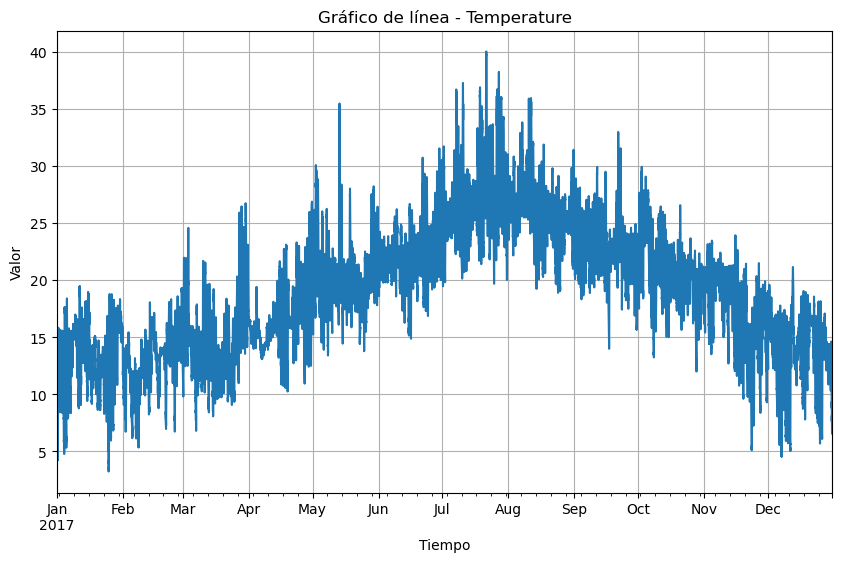

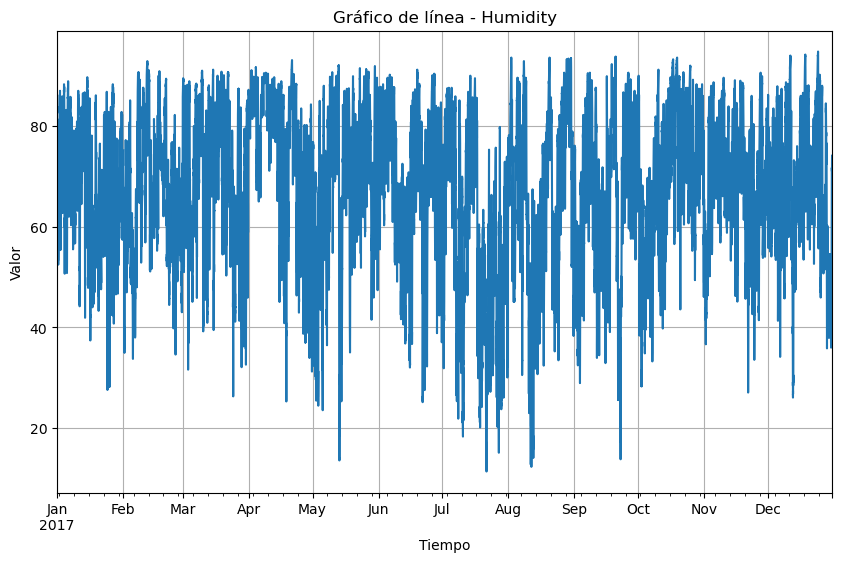

KeyboardInterrupt: 

In [515]:
for column in datos.columns:
    plt.figure(figsize=(10, 6))
    datos[column].plot(kind='line')
    plt.title(f'Gráfico de línea - {column}')
    plt.xlabel('Tiempo')
    plt.ylabel('Valor')
    plt.grid(True)
    plt.show()

In [514]:
statistics = datos.describe()
print(statistics)

        Temperature      Humidity     WindSpeed  GeneralDiffuseFlows  \
count  52416.000000  52416.000000  52416.000000         52416.000000   
mean      18.810024     68.259518      1.959489           182.696614   
std        5.815476     15.551177      2.348862           264.400960   
min        3.247000     11.340000      0.050000             0.004000   
25%       14.410000     58.310000      0.078000             0.062000   
50%       18.780000     69.860000      0.086000             5.035500   
75%       22.890000     81.400000      4.915000           319.600000   
max       40.010000     94.800000      6.483000          1163.000000   

       DiffuseFlows  PowerConsumption_Zone1  PowerConsumption_Zone2  \
count  52416.000000            52416.000000            52416.000000   
mean      75.028022            32344.970564            21042.509082   
std      124.210949             7130.562564             5201.465892   
min        0.011000            13895.696200             8560.081466

array([<Axes: xlabel='fechas'>, <Axes: xlabel='fechas'>,
       <Axes: xlabel='fechas'>, <Axes: xlabel='fechas'>,
       <Axes: xlabel='fechas'>, <Axes: xlabel='fechas'>,
       <Axes: xlabel='fechas'>, <Axes: xlabel='fechas'>], dtype=object)

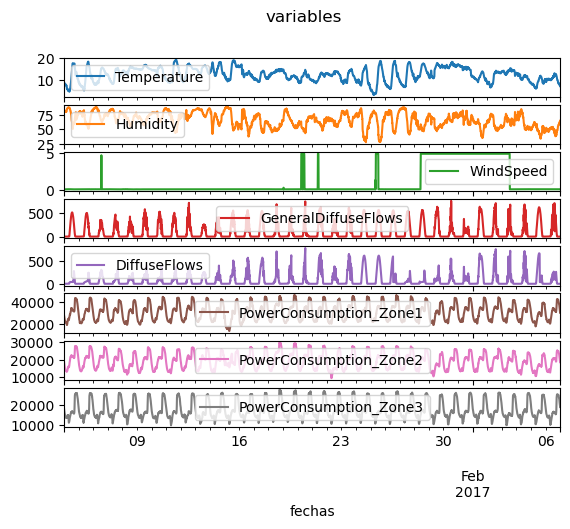

In [86]:
datos.plot(subplots = True, xlabel= 'fechas' , title = 'variables')

In [127]:
def ma(t, x, ws= 5):
    ''' Funcion para calcular la media movil de una serie temporal (simetrica)
        Entradas:
            - t: timestamps
            - x: serie datos
            - ws: tamaño de la ventana
        Salidas:
            - t: timestamps
            - y: media movil
    '''

    assert ws%2 == 1, 'ws debe ser entero e impar' 
    n_samples = x.shape[0]
    n_windows = n_samples-ws
    tstamps = []
    y = np.zeros(n_windows)
    for i in range(0, n_windows):
        right = n_samples - i 
        left = n_samples - i - ws 
        y[n_windows - i - 1] = x[left:right].mean() 
        tstamps.insert(0,t[(left+right)//2])
    return tstamps, y


## MEDIA MOVIL

In [158]:
# Analizamos la media movil 
ws = 143 # ancho de la ventana temporal 1 dia
m_averaged = []
for c in list(datos.columns)[0:]:
    t, d = ma(datos.index,datos[c].to_numpy(), ws=ws)
    m_averaged.append(d)
Tendencia = np.array(m_averaged).T
labels = list(datos.columns)[0:]
print(t)
print(labels)

[Timestamp('2017-01-01 12:00:00'), Timestamp('2017-01-01 12:10:00'), Timestamp('2017-01-01 12:20:00'), Timestamp('2017-01-01 12:30:00'), Timestamp('2017-01-01 12:40:00'), Timestamp('2017-01-01 12:50:00'), Timestamp('2017-01-01 13:00:00'), Timestamp('2017-01-01 13:10:00'), Timestamp('2017-01-01 13:20:00'), Timestamp('2017-01-01 13:30:00'), Timestamp('2017-01-01 13:40:00'), Timestamp('2017-01-01 13:50:00'), Timestamp('2017-01-01 14:00:00'), Timestamp('2017-01-01 14:10:00'), Timestamp('2017-01-01 14:20:00'), Timestamp('2017-01-01 14:30:00'), Timestamp('2017-01-01 14:40:00'), Timestamp('2017-01-01 14:50:00'), Timestamp('2017-01-01 15:00:00'), Timestamp('2017-01-01 15:10:00'), Timestamp('2017-01-01 15:20:00'), Timestamp('2017-01-01 15:30:00'), Timestamp('2017-01-01 15:40:00'), Timestamp('2017-01-01 15:50:00'), Timestamp('2017-01-01 16:00:00'), Timestamp('2017-01-01 16:10:00'), Timestamp('2017-01-01 16:20:00'), Timestamp('2017-01-01 16:30:00'), Timestamp('2017-01-01 16:40:00'), Timestamp('20

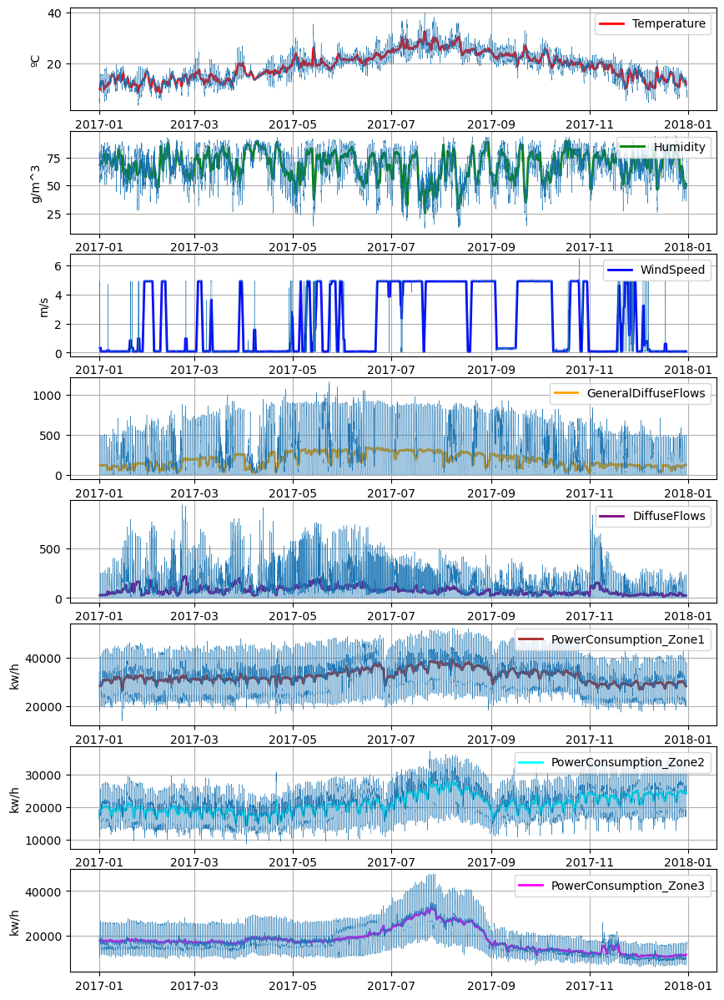

In [159]:
colors = ['red', 'green', 'blue', 'orange', 'purple', 'brown', 'cyan','magenta']
unidades = ['ºC','g/m^3','m/s','','','kw/h','kw/h','kw/h']
fig, axs = plt.subplots(len(labels),1, figsize=(10,15))
for i in range(len(labels)):
    axs[i].plot(t, Tendencia[:,i], label = labels[i], color = colors[i],linewidth=2)
    axs[i].legend(loc='upper right')
    axs[i].grid(True)
    axs[i].set_ylabel(rf'{unidades[i]}')  # Agregar etiqueta al eje y con LaTeX
for i in range(len(labels)):
    axs[i].plot(datos.index,datos.iloc[:, i],linewidth=0.3)
plt.show()

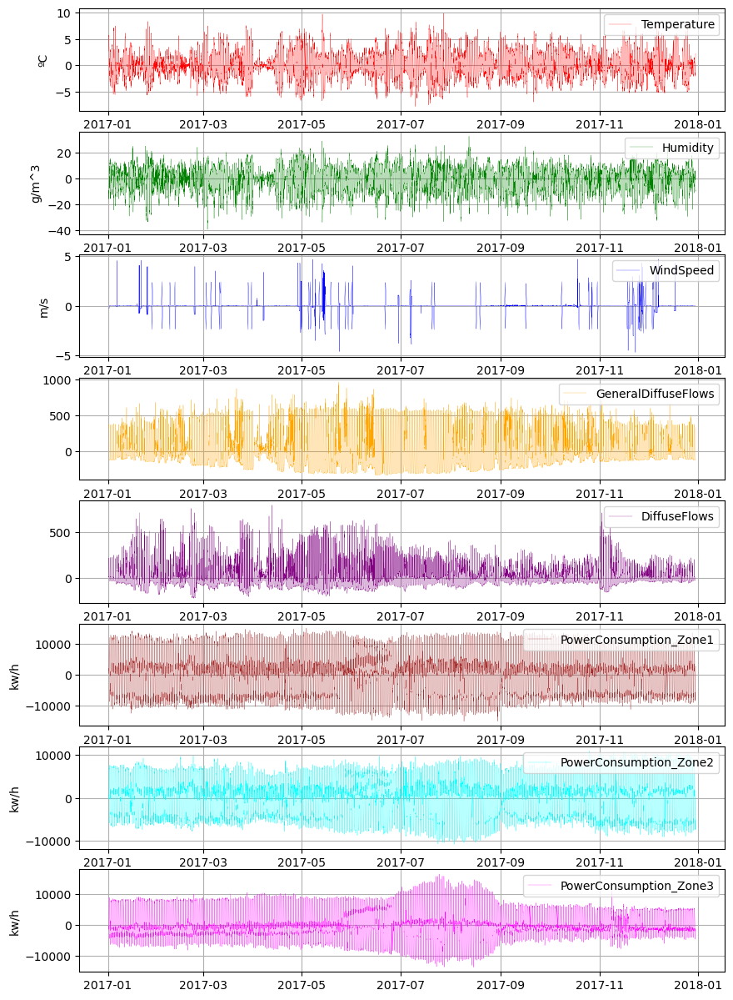

In [189]:

x_prima =  datos.values[71:52416-72]- Tendencia

colors = ['red', 'green', 'blue', 'orange', 'purple', 'brown', 'cyan','magenta']
unidades = ['ºC','g/m^3','m/s','','','kw/h','kw/h','kw/h']
fig, axs = plt.subplots(len(labels),1, figsize=(10,15))
for i in range(len(labels)):
    axs[i].plot(t, x_prima[:,i], label = labels[i], color = colors[i],linewidth=0.2)
    axs[i].legend(loc='upper right')
    axs[i].grid(True)
    axs[i].set_ylabel(rf'{unidades[i]}')  # Agregar etiqueta al eje y con LaTeX
plt.show()

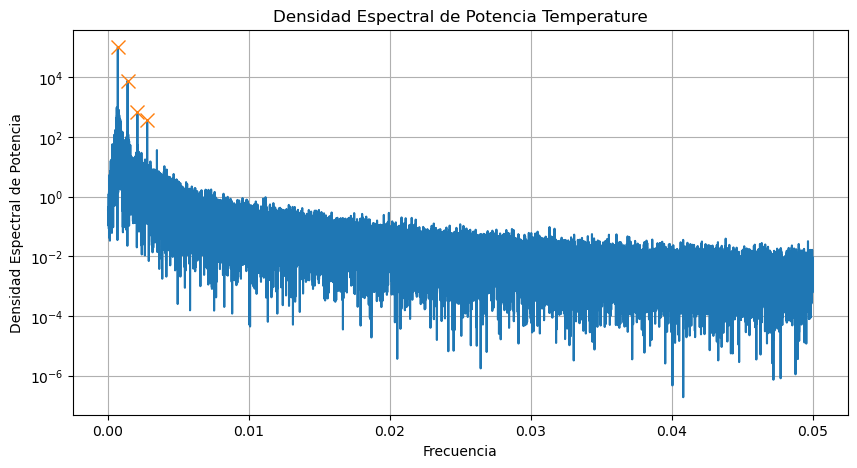

Períodos de oscilación [24.00045914 12.00022957  8.00015305  6.00011478]


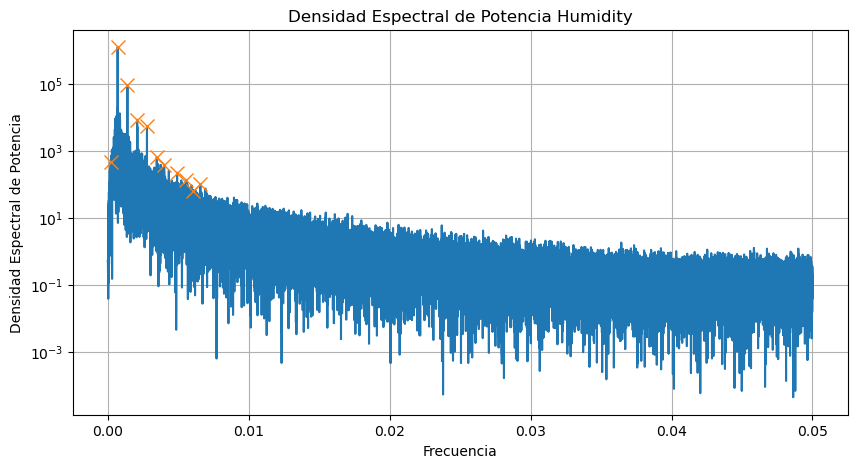

Períodos de oscilación [84.58414239 24.00045914 12.00022957  8.00750613  6.00011478  4.80009183
  4.1685008   3.39126768  3.01146445  2.76225956  2.53924998]


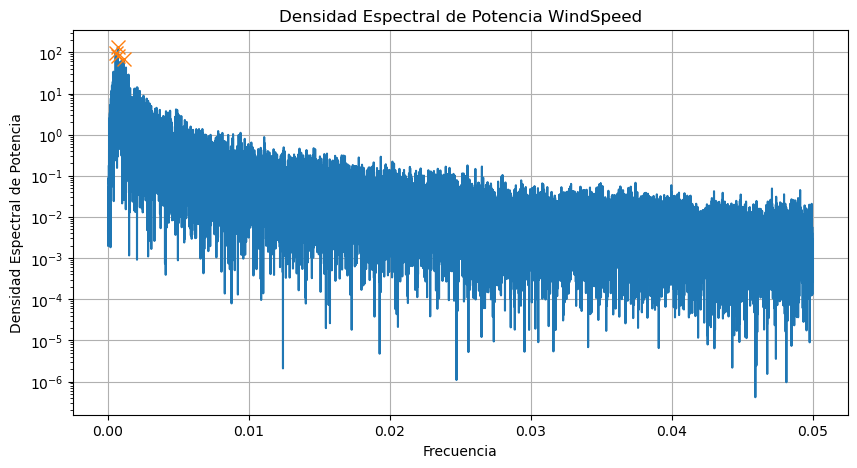

Períodos de oscilación [30.89420804 24.26787372 24.00045914 15.09907568]


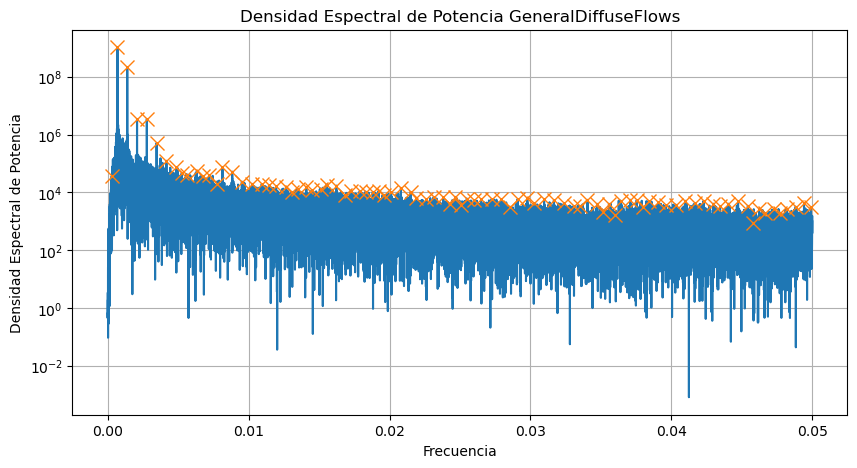

Períodos de oscilación [59.67237443 24.00045914 12.00022957  8.00750613  6.00011478  4.80273796
  3.99824078  3.42998688  3.17498785  2.95327684  2.63446225  2.46873524
  2.31153268  2.15062125  2.04655078  1.88575036  1.75048557  1.62722575
  1.5247054   1.4559102   1.39394667  1.31743031  1.27576024  1.23489251
  1.18227258  1.14951401  1.10308517  1.07305908  1.0271359   0.98799803
  0.96587214  0.93228108  0.91064771  0.88601309  0.86722742  0.84996748
  0.82854652  0.80089784  0.77503484  0.76122033  0.73700759  0.72072855
  0.69971622  0.68707939  0.67567603  0.6645943   0.65401747  0.64088323
  0.62899189  0.61172354  0.59651946  0.58392538  0.57301807  0.55965611
  0.55049707  0.53815348  0.5263513   0.51429555  0.50411796  0.49698612
  0.48950257  0.47971844  0.47384786  0.4685472   0.46324064  0.45795662
  0.44938189  0.44404519  0.43867909  0.43421883  0.4265025   0.42073534
  0.41358494  0.40657862  0.39980573  0.39416218  0.38779341  0.38352556
  0.37844432  0.37256956  0.

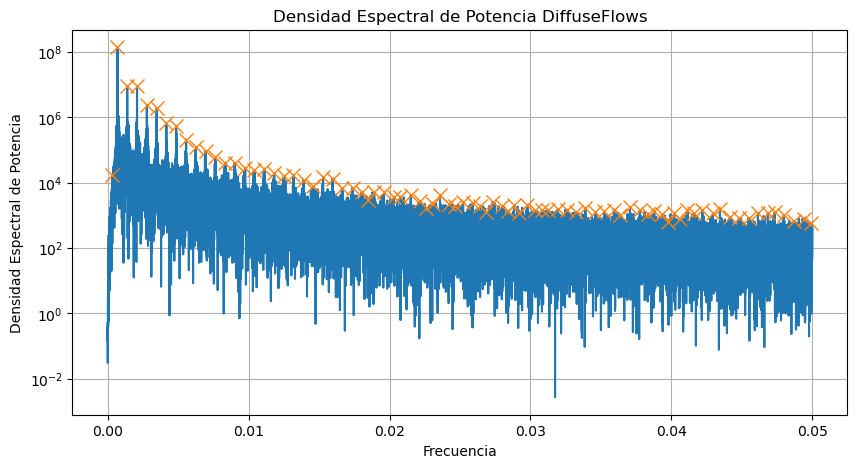

Períodos de oscilación [53.77880658 24.00045914 12.01678161  8.00015305  6.00011478  4.7974486
  4.00007652  3.42728822  2.99902467  2.66182911  2.40004591  2.18624007
  1.99774517  1.85089583  1.70826797  1.60741082  1.50028701  1.41042038
  1.33295084  1.26409847  1.19936215  1.14377927  1.09024736  1.04287367
  1.00266621  0.95906722  0.92525135  0.90337688  0.88117393  0.84996748
  0.82043193  0.80311271  0.7751038   0.75221608  0.73794398  0.72192299
  0.70669749  0.68756741  0.67567603  0.66076349  0.64305925  0.63044842
  0.62065731  0.61005298  0.5949308   0.58659889  0.57795984  0.57035461
  0.55969206  0.54994108  0.54092678  0.53331089  0.5219992   0.51166774
  0.501564    0.49168501  0.48181433  0.47307595  0.46393134  0.45826977
  0.44968342  0.44141291  0.43463041  0.42972115  0.42359929  0.41937839
  0.41452951  0.41017734  0.40506633  0.40087271  0.3949484   0.38801793
  0.38361     0.37757505  0.37212398  0.3660728   0.36117099  0.35581649
  0.35220596  0.34741662  0.3

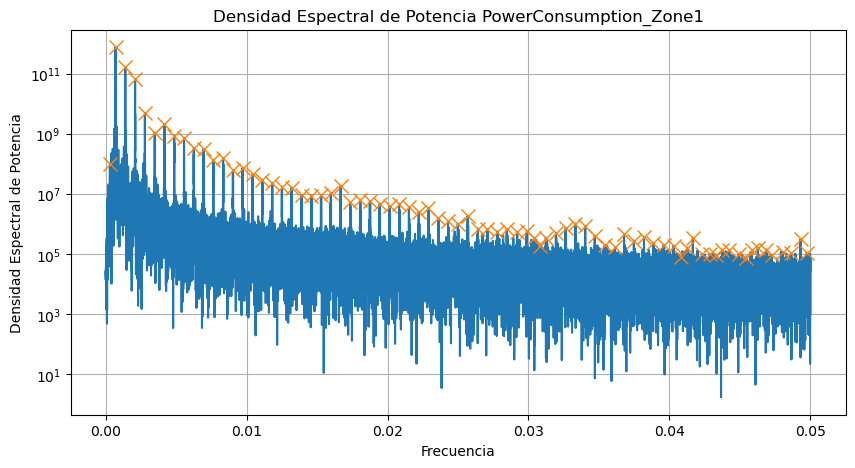

Períodos de oscilación [56.20752688 24.00045914 12.00022957  8.00015305  6.00011478  4.79480829
  4.00191395  3.42998688  3.00109083  2.66753419  2.40136898  2.18240648
  2.00095697  1.84501624  1.71297025  1.59856269  1.5000287   1.41247838
  1.3323393   1.26373175  1.19919706  1.14198016  1.09011094  1.04349822
  1.00001913  0.96065351  0.92309458  0.8894504   0.85715925  0.82689509
  0.80045633  0.77469026  0.75040195  0.72771188  0.70623919  0.68615946
  0.66713888  0.64904765  0.63099635  0.61578786  0.59980493  0.58569188
  0.57102751  0.55772144  0.54817635  0.54028941  0.53367024  0.52171787
  0.51064807  0.49998087  0.48980529  0.48030027  0.47077524  0.46113199
  0.45309791  0.4447252   0.43635013  0.42883278  0.42101999  0.41360457
  0.40810224  0.40386458  0.40004439  0.39359235  0.38884922  0.38472805
  0.38097633  0.37664462  0.37109369  0.36699805  0.36340063  0.36020038
  0.35565671  0.35251949  0.34702914  0.34264795  0.33802152  0.33508333]


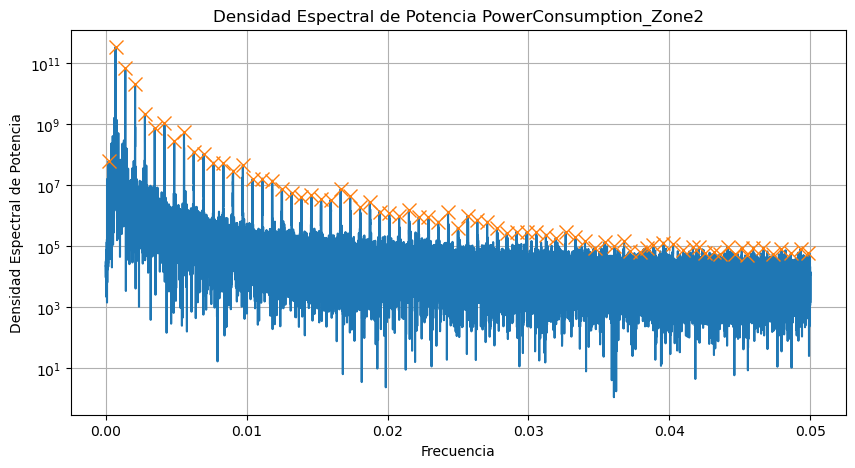

Períodos de oscilación [83.77083333 24.00045914 12.00022957  8.00015305  5.99598532  4.80009183
  4.00191395  3.42998688  3.00109083  2.66508616  2.40136898  2.18022189
  1.99820336  1.84462559  1.71297025  1.59885606  1.49899633  1.41064875
  1.3341756   1.26409847  1.20068449  1.14212987  1.09011094  1.04349822
  1.00001913  0.96065351  0.92358387  0.8894504   0.85774999  0.82815272
  0.80045633  0.77469026  0.75053124  0.72771188  0.70629645  0.68615946
  0.66703673  0.64904765  0.63200339  0.61574434  0.60038362  0.58573125
  0.57170199  0.55772144  0.54573833  0.53363755  0.5219992   0.51064807
  0.50000957  0.49005325  0.48000918  0.47087702  0.46174299  0.45309791
  0.44785723  0.43940922  0.43430542  0.42881167  0.42122355  0.41403701
  0.40680644  0.40000765  0.39593559  0.39175173  0.38604071  0.38238091
  0.37772238  0.37304816  0.36928479  0.36608819  0.36278021  0.35731961
  0.35207786  0.34755522  0.34280974  0.33802152  0.33423489]


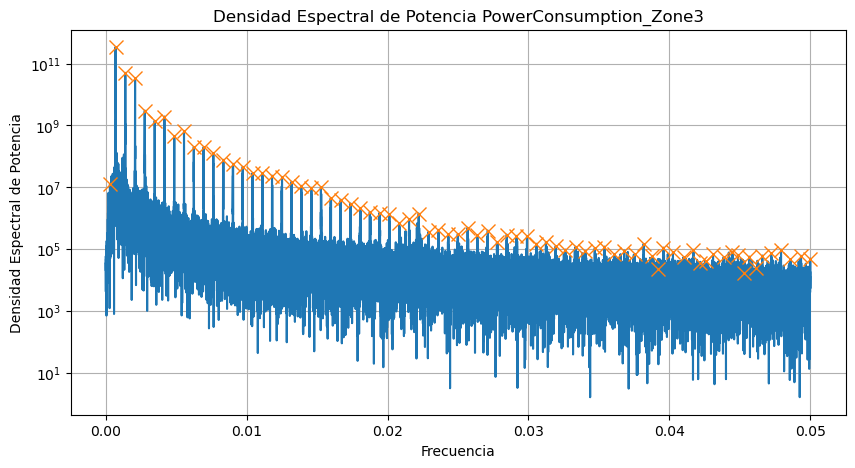

Períodos de oscilación [55.84722222 24.00045914 12.00022957  8.00015305  6.00424994  4.80009183
  4.00191395  3.42594049  3.00109083  2.66753419  2.40070727  2.18295331
  2.00095697  1.84462559  1.71499344  1.59885606  1.49873846  1.41247838
  1.3323393   1.26373175  1.20068449  1.14198016  1.09147666  1.04412352
  0.99921627  0.95917281  0.92338809  0.8894504   0.85707493  0.82799531
  0.80038279  0.77434598  0.75053124  0.7276511   0.70635371  0.6860514
  0.66713888  0.64904765  0.6319117   0.61478842  0.60038362  0.58573125
  0.57181456  0.55757867  0.54543083  0.53353951  0.52209305  0.51091759
  0.49975143  0.49005325  0.4802738   0.47090247  0.46166958  0.45309791
  0.44384159  0.43665631  0.42969996  0.42529493  0.42108104  0.41405668
  0.40648377  0.39962234  0.39512752  0.39148767  0.38672615  0.38016174
  0.37505561  0.37150512  0.36800569  0.36489222  0.36103629  0.35770105
  0.35291933  0.34779108  0.34310675  0.33779872  0.33337798]


In [441]:
from scipy.signal import find_peaks

delta_t = 10
n = len(x_prima)
distancia = [250,250,2,200,200,200,200,200]
frecuencias = {}
for i in range(x_prima.shape[1]):
    spectral_density = np.abs(np.fft.fft(x_prima[:, i], norm='ortho')) ** 2
    freqs = np.fft.fftfreq(n, delta_t)
    
    # Limita los datos solo para las frecuencias positivas
    freqs_positivas = freqs[:n//2]
    spectral_density_positiva = spectral_density[:n//2]
    
    # Crea una nueva figura para cada columna
    plt.figure(figsize=(10, 5))
    plt.semilogy(freqs_positivas, spectral_density_positiva)
    plt.title(f'Densidad Espectral de Potencia {labels[i]}')
    plt.xlabel('Frecuencia')
    plt.ylabel('Densidad Espectral de Potencia')
    plt.grid(True)
    
        # Encuentra picos en la densidad espectral de potencia
    peaks = find_peaks(spectral_density_positiva, threshold=50, distance = distancia[i])[0]
    
    # Crea una nueva figura para cada columna
    plt.semilogy(freqs_positivas[peaks], spectral_density_positiva[peaks], 'x', ms=10)
    plt.show()
    frecuencias[labels[i]] = ((freqs[peaks]))
    print(f'Períodos de oscilación {(1/freqs[peaks])/60}')




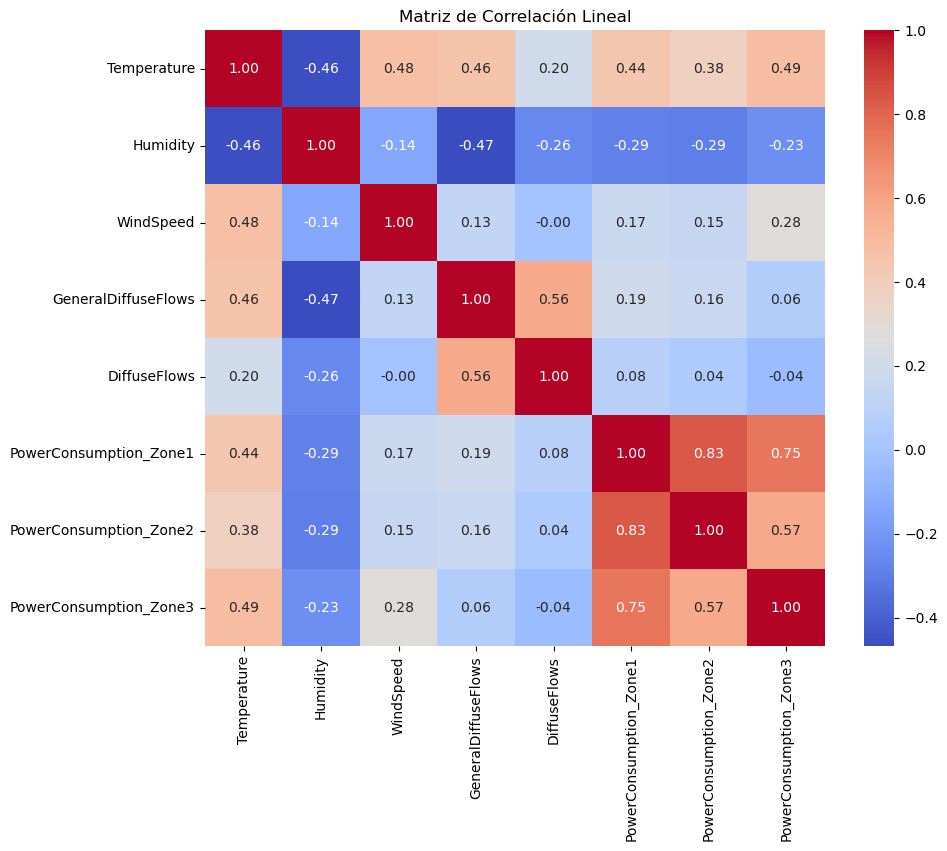

In [451]:
import seaborn as sns
correlation_matrix = x.corr()

# Crea un mapa de calor de la matriz de correlación usando Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación Lineal')
plt.show()

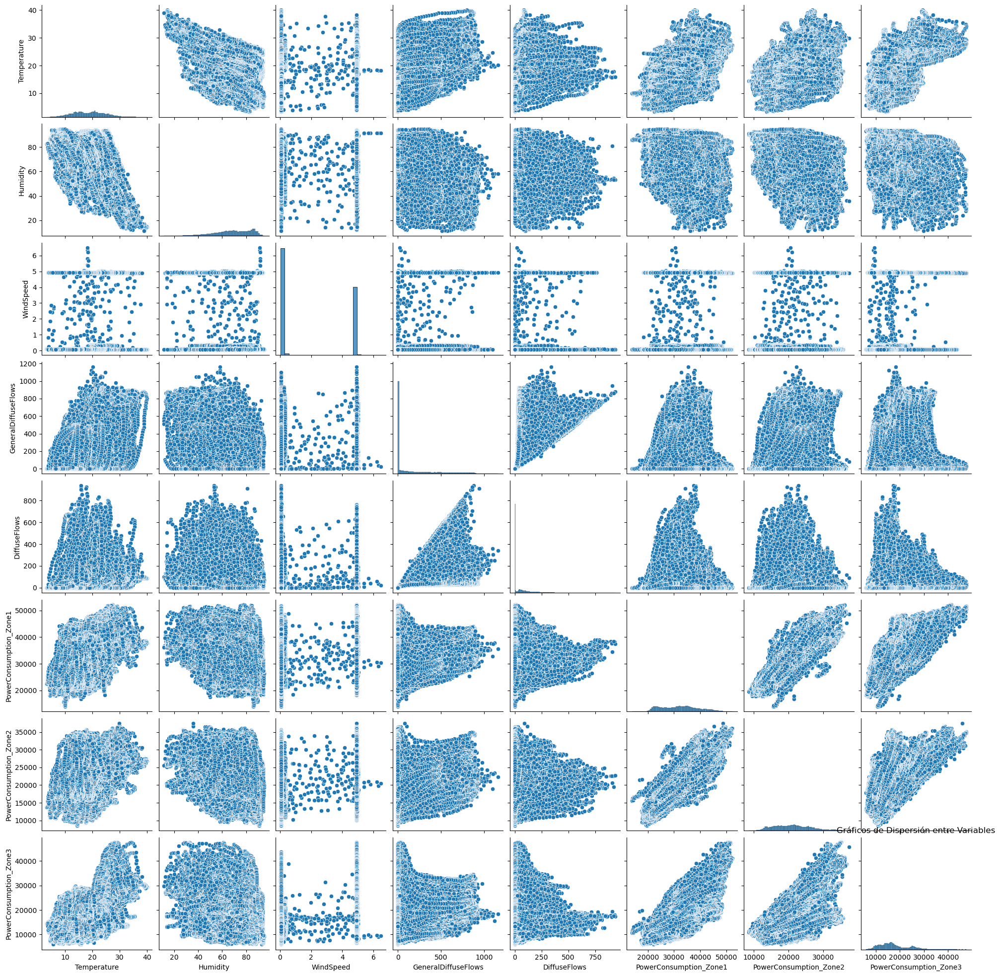

In [452]:
sns.pairplot(datos)
plt.title('Gráficos de Dispersión entre Variables')
plt.show()

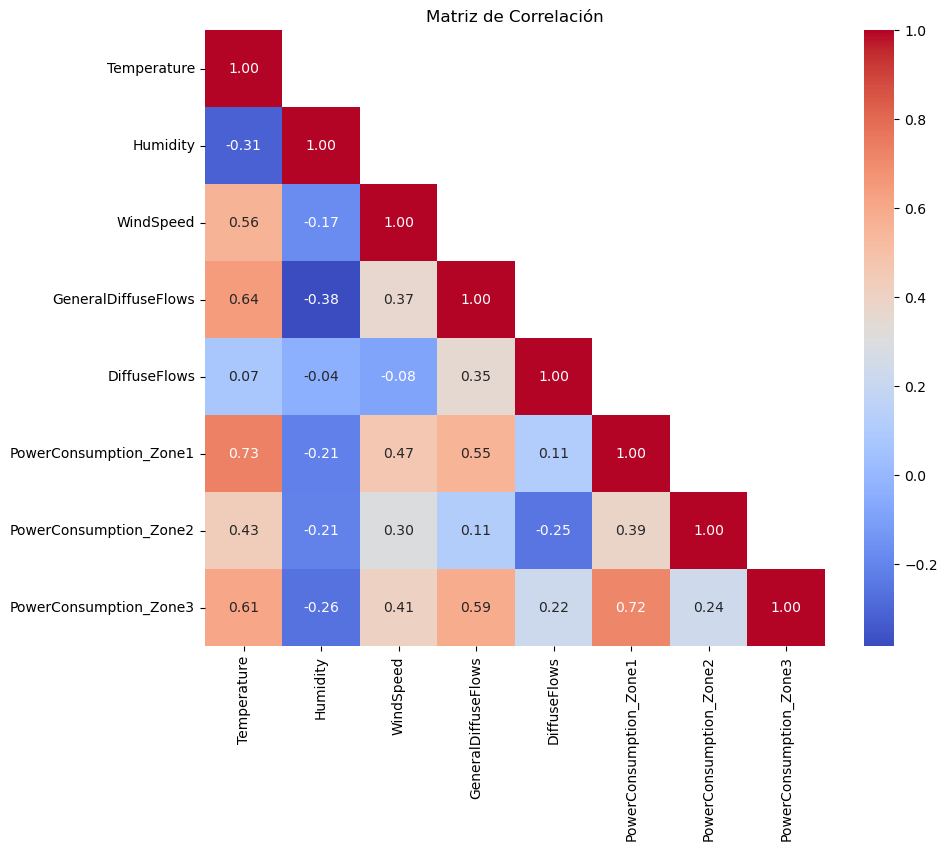

In [464]:
correlation_matrix = np.corrcoef(Tendencia, rowvar=False)
correlation_matrix[np.triu_indices_from(correlation_matrix, k=1)] = np.nan

# Crea un mapa de calor de la matriz de correlación usando Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", xticklabels=labels, yticklabels=labels)
plt.title('Matriz de Correlación')
plt.show()

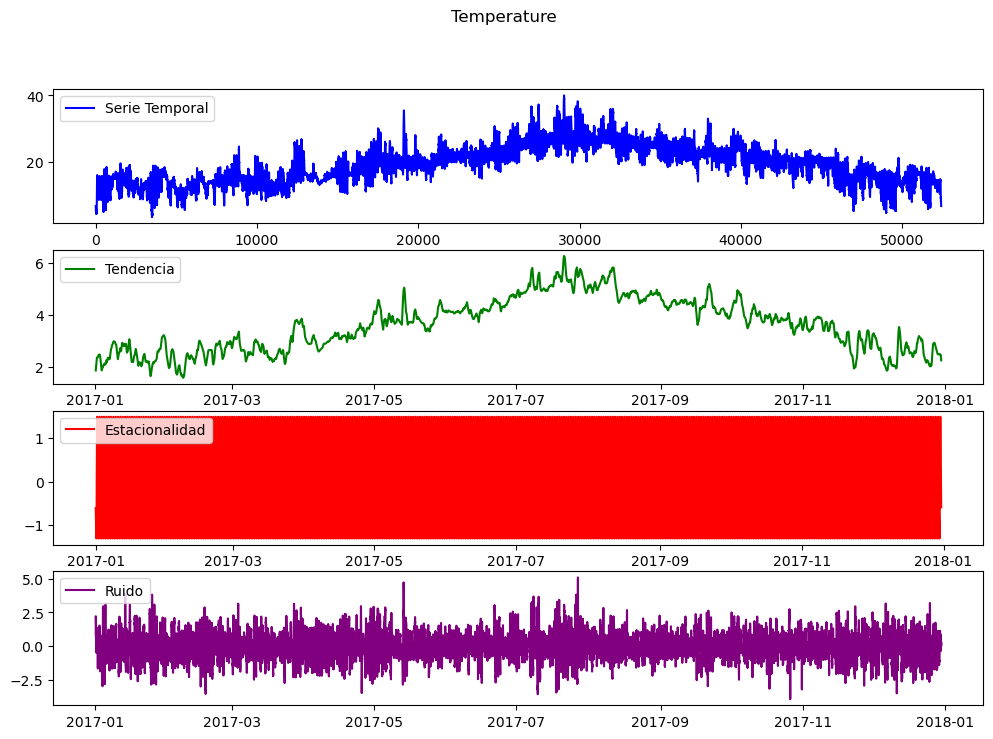

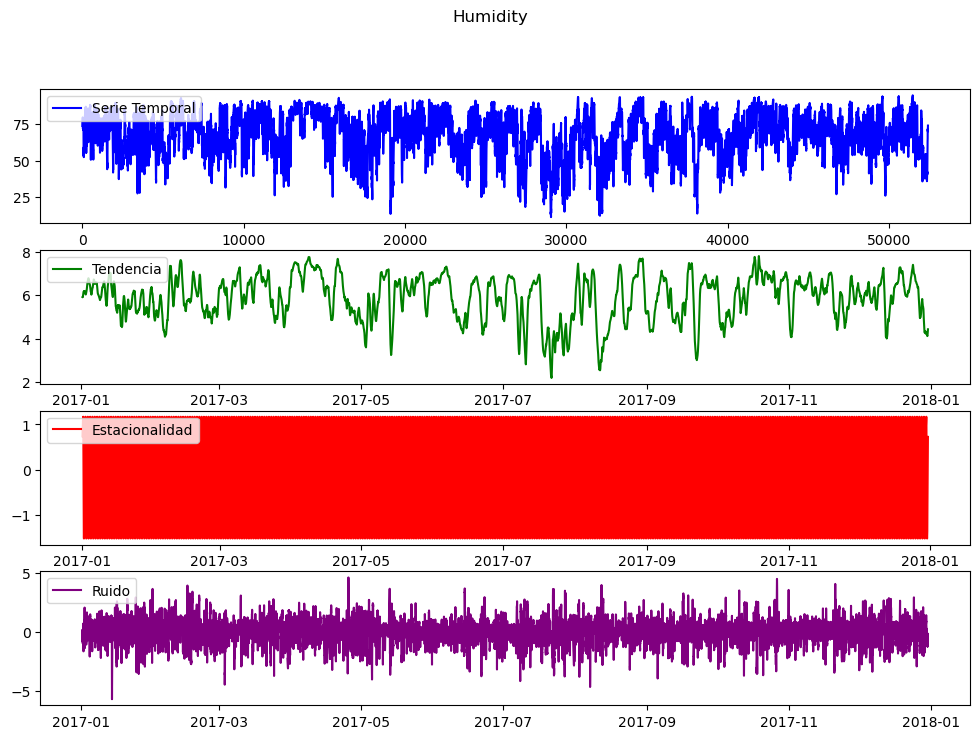

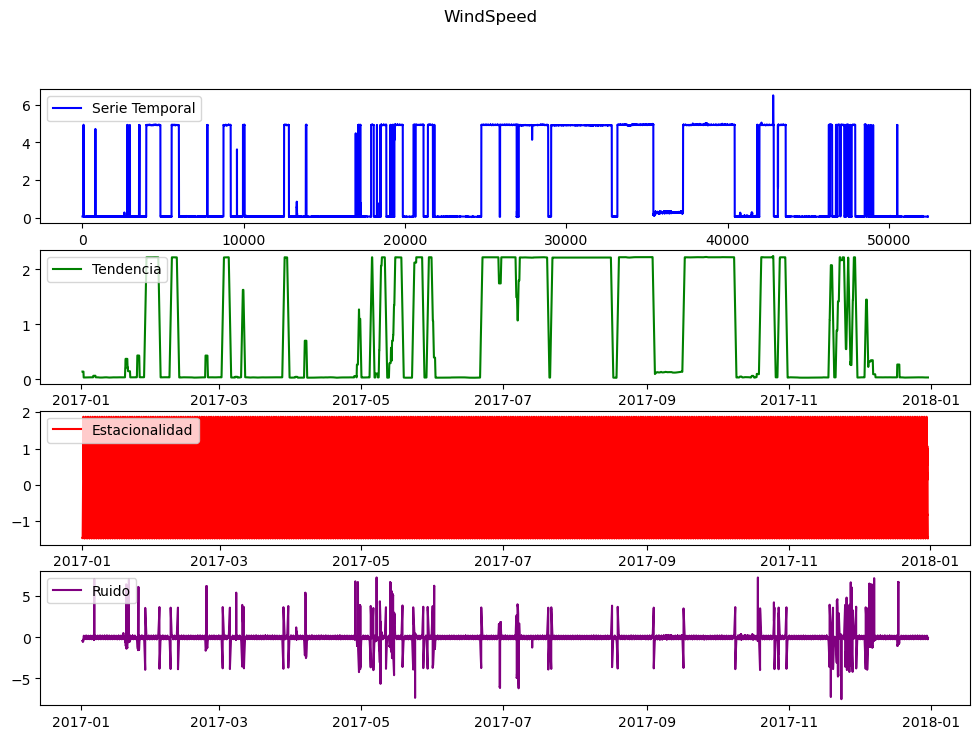

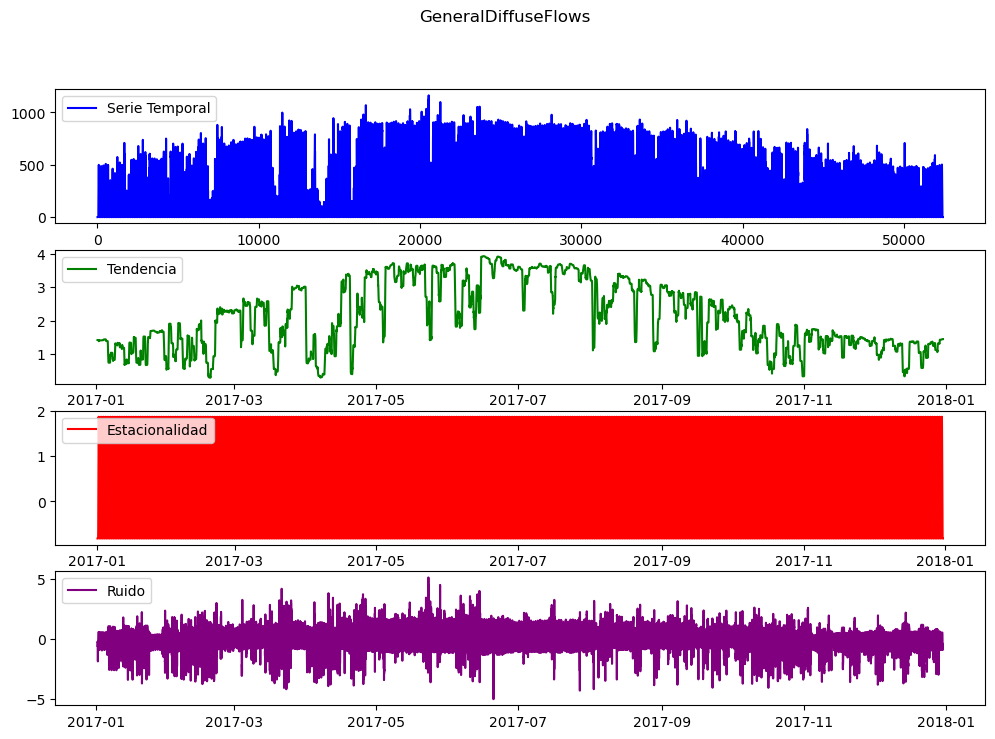

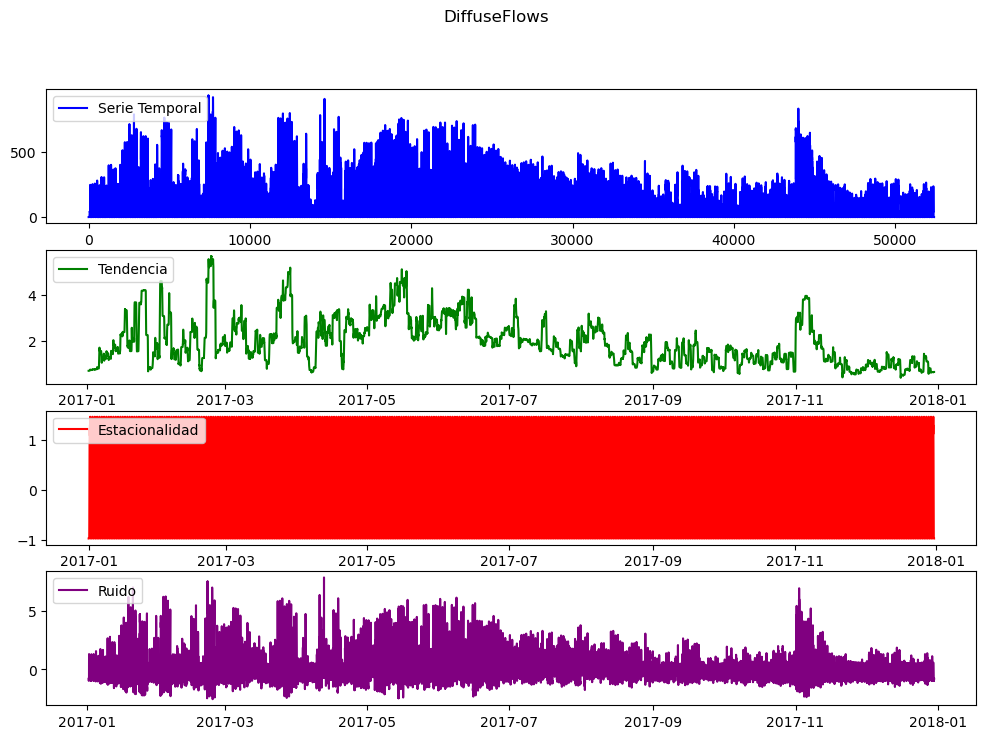

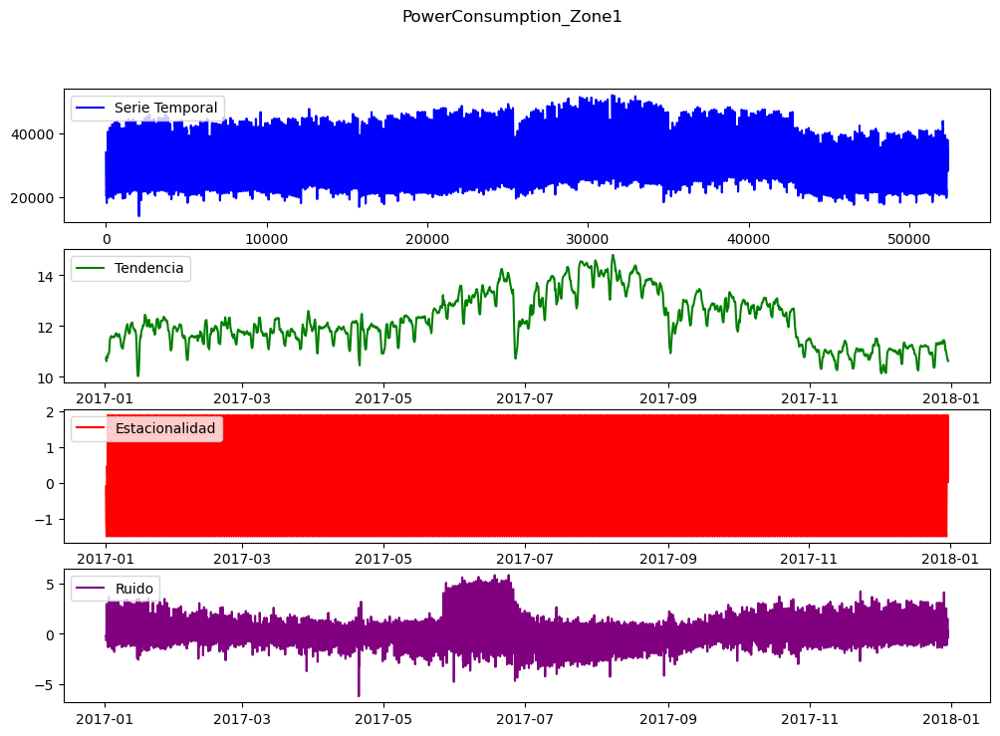

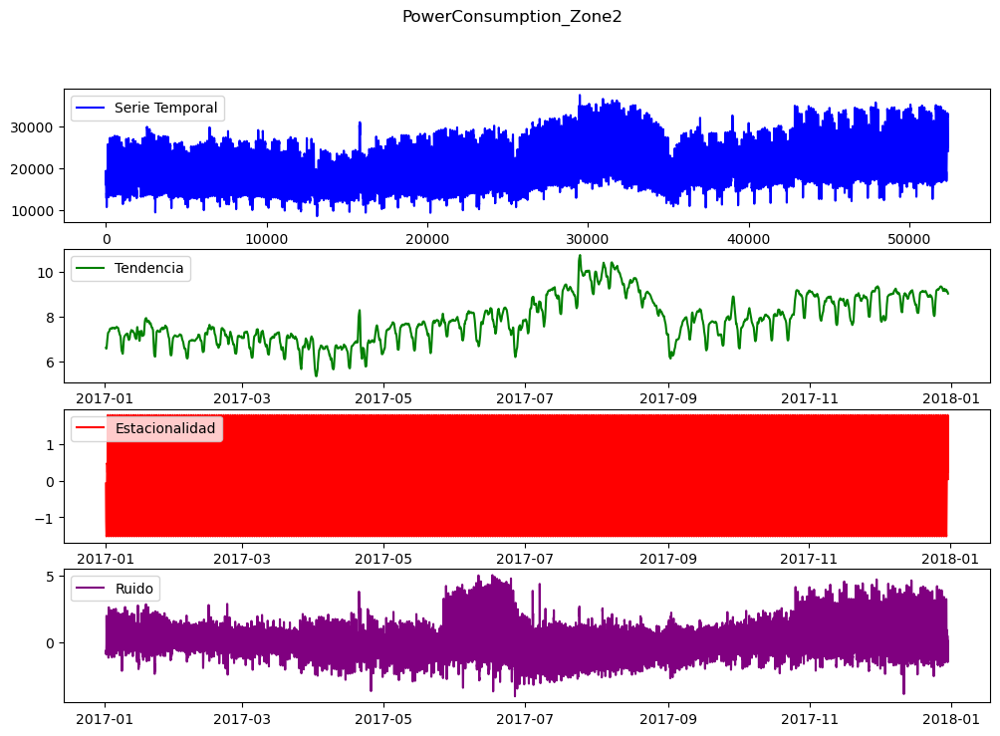

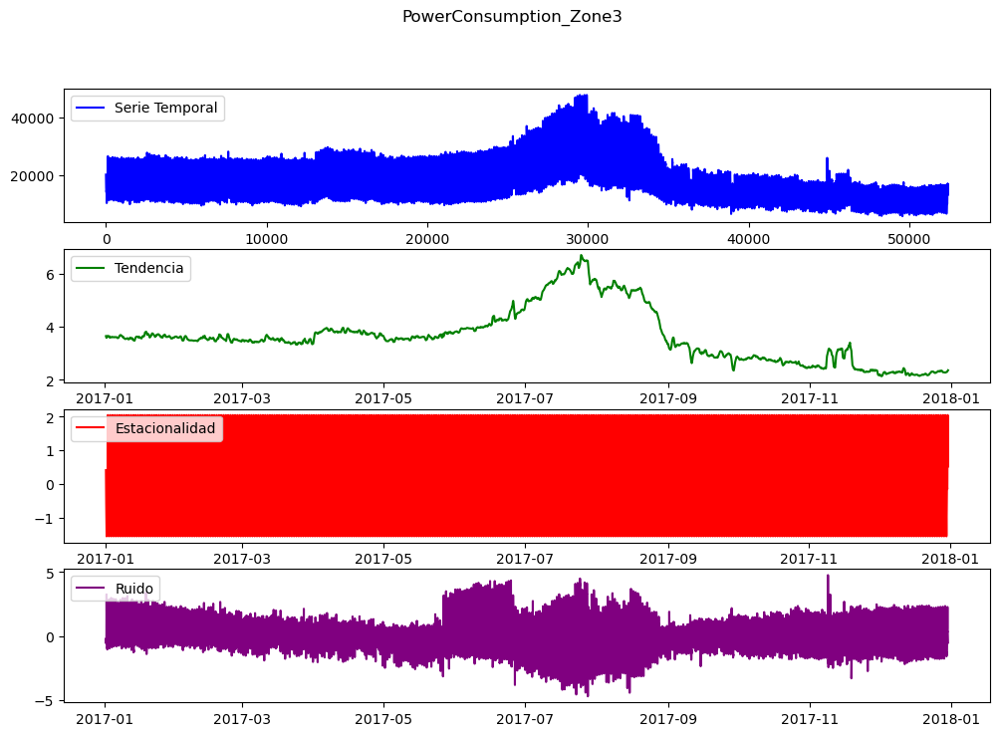

In [478]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Realiza la descomposición de la serie temporal
colors = ['blue', 'green', 'red', 'purple']

# Realiza la descomposición para cada columna
result = {}
for i, (column, label) in enumerate(zip(datos.columns, labels)):
    result[label] = seasonal_decompose(datos[column], model='additive', period=24*6)  # 24*6 = 144, para datos cada 10 minutos

# Grafica los componentes de cada columna con colores distintos
for label, decomposition in result.items():
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid
    
    # Normalizar las escalas de los componentes
    trend_norm = trend / trend.std()
    seasonal_norm = seasonal / seasonal.std()
    residual_norm = residual / residual.std()
    
    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(df[label], color=colors[0], label='Serie Temporal')
    plt.legend(loc='upper left')
    
    plt.subplot(412)
    plt.plot(trend_norm, color=colors[1], label='Tendencia')
    plt.legend(loc='upper left')
    
    plt.subplot(413)
    plt.plot(seasonal_norm, color=colors[2], label='Estacionalidad')
    plt.legend(loc='upper left')
    
    plt.subplot(414)
    plt.plot(residual_norm, color=colors[3], label='Ruido')
    plt.legend(loc='upper left')
    
    plt.suptitle(label)
    plt.show()

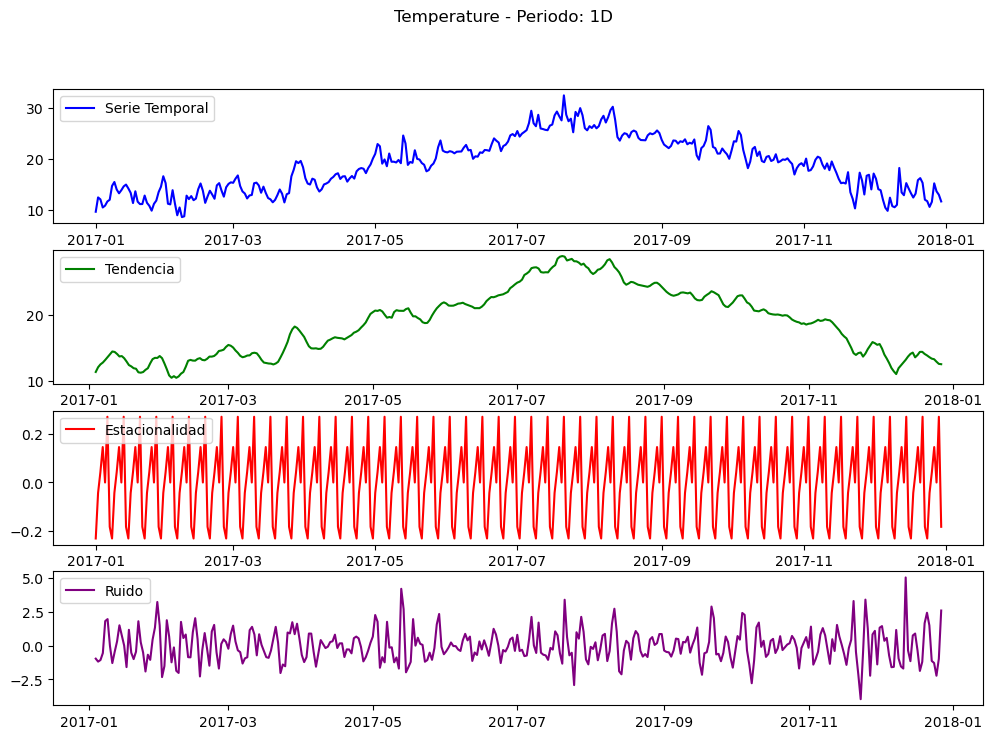

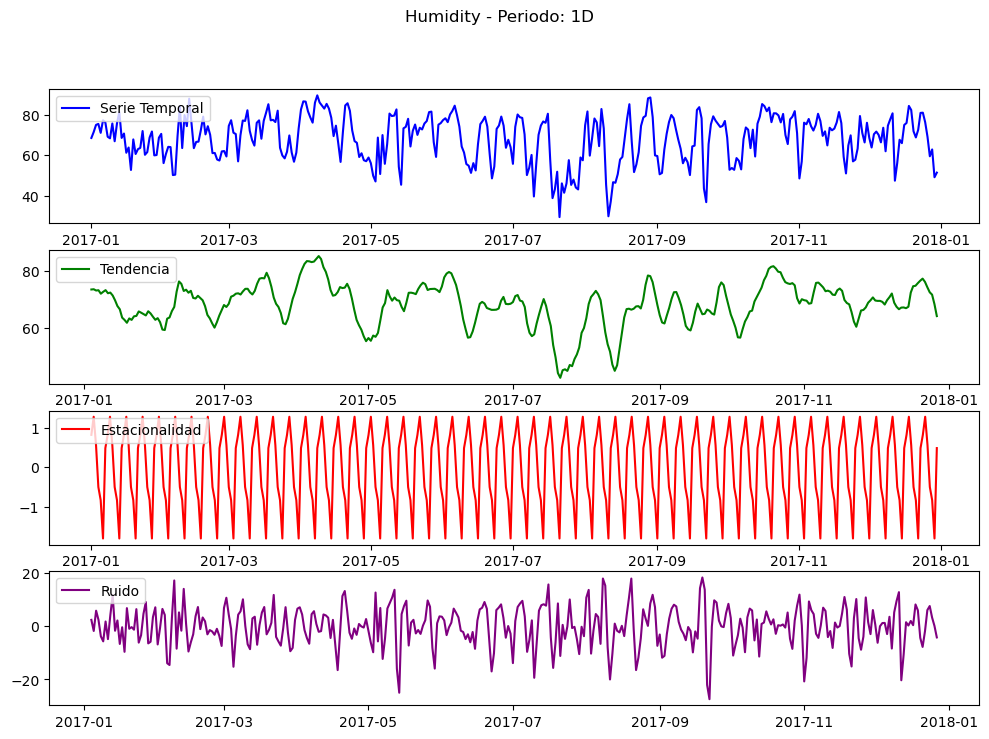

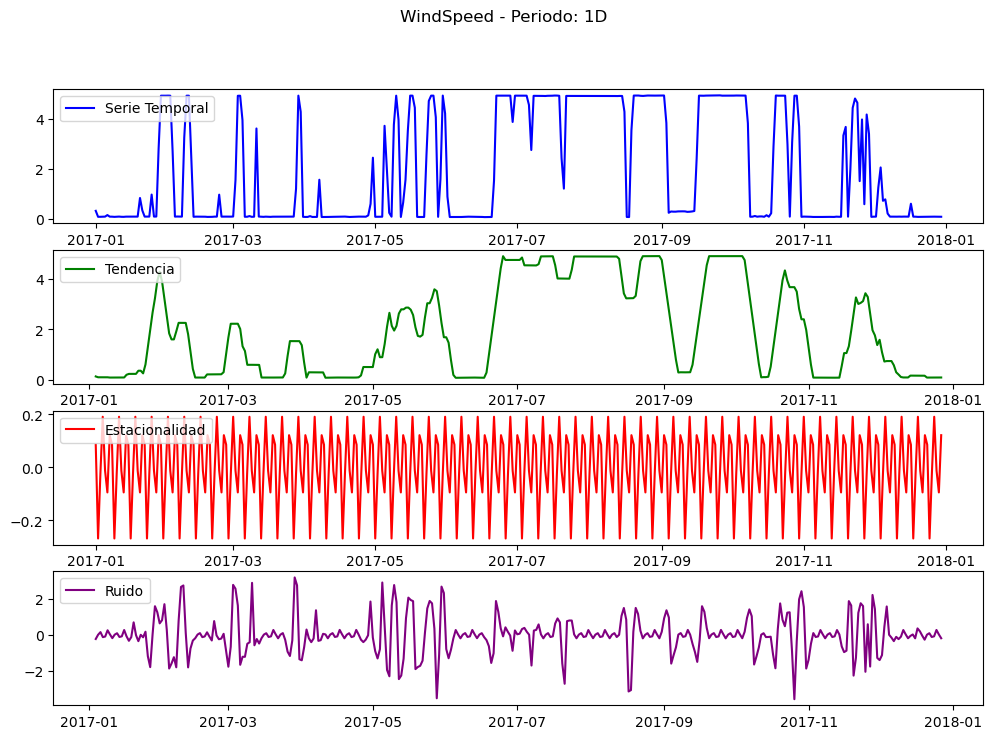

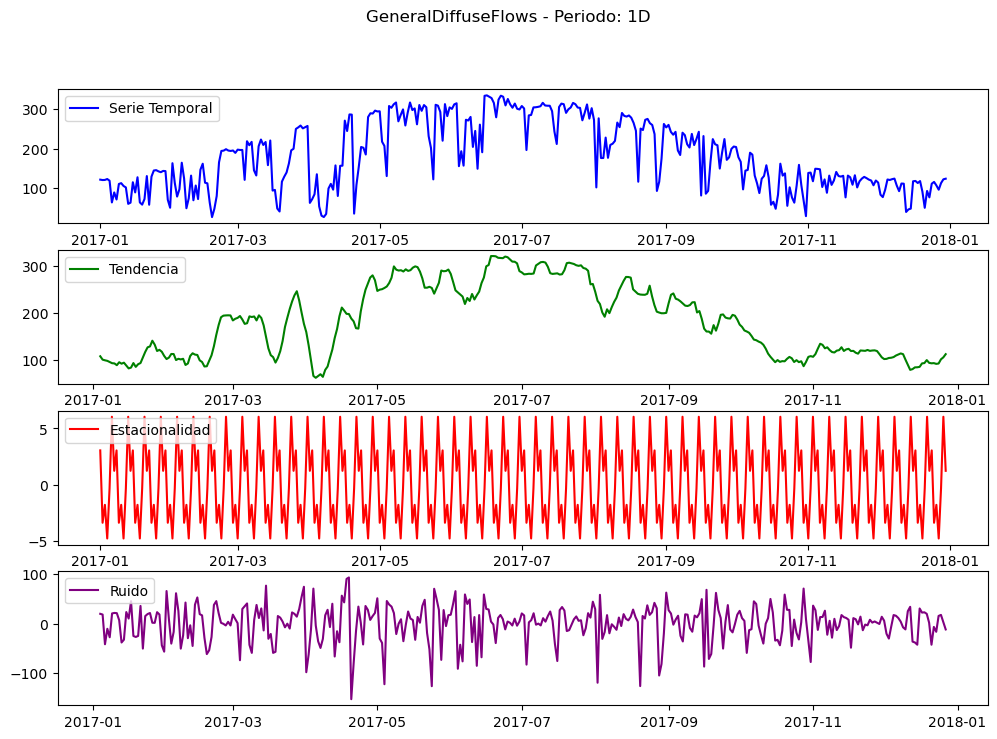

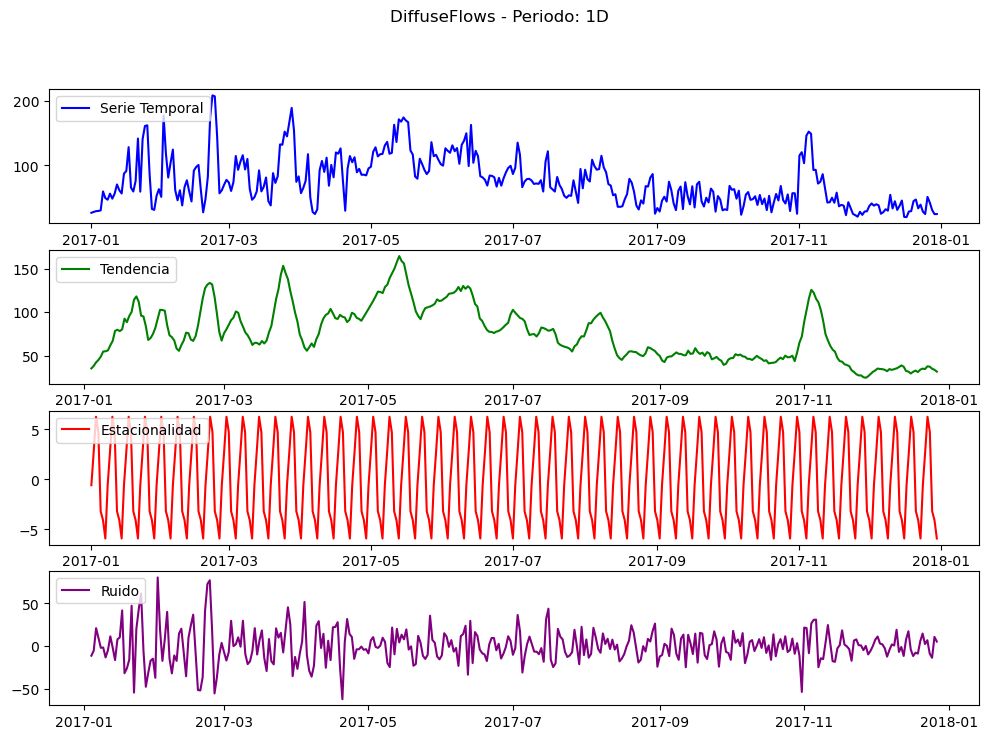

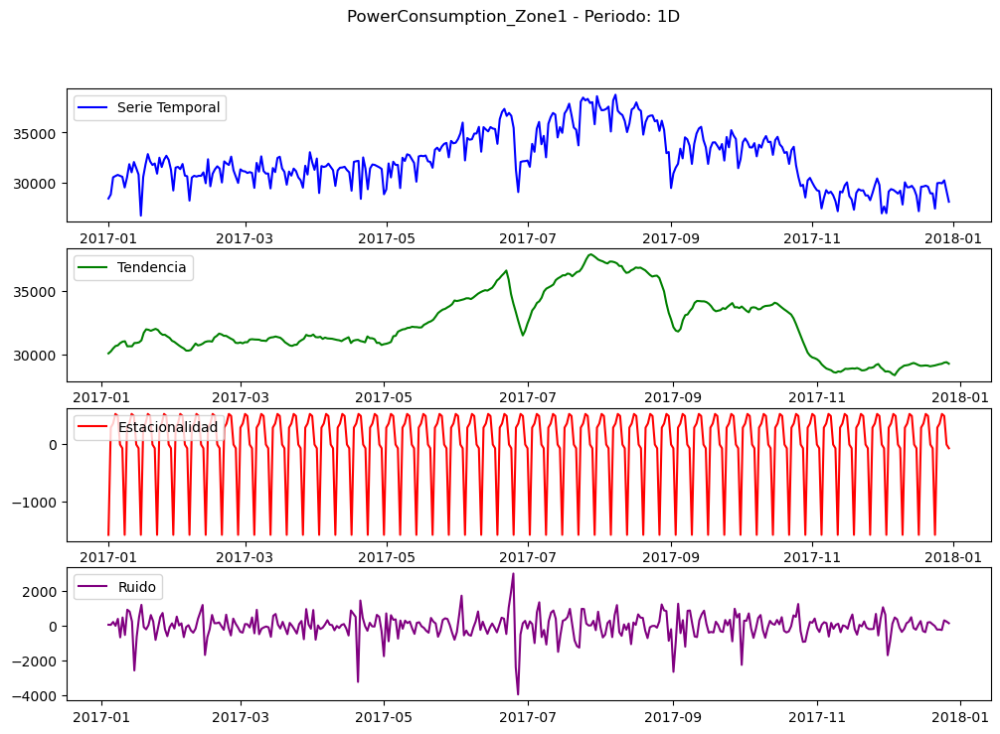

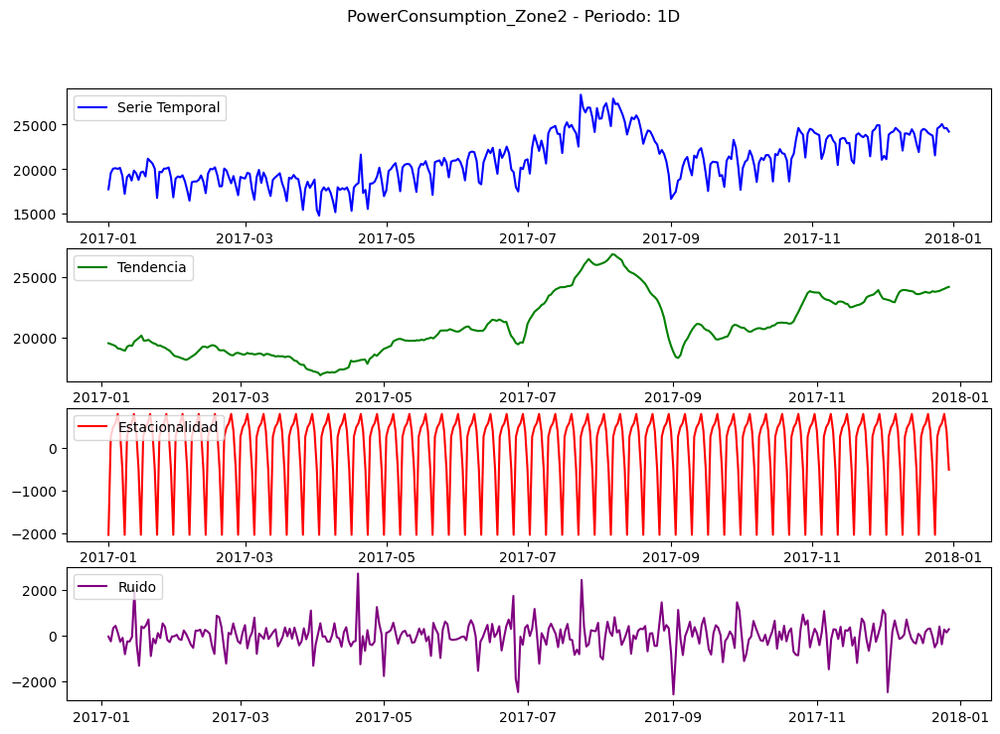

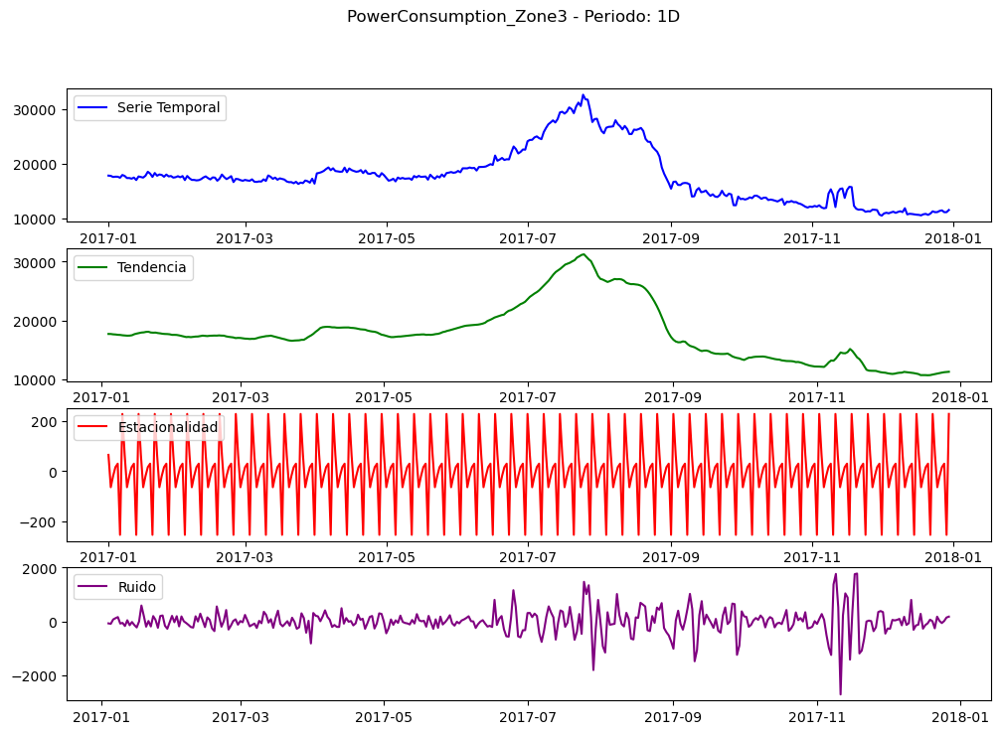

In [485]:
period = '1D'

resampled_df = datos.resample(period).mean()  # Agrega los datos según el período de tiempo
result = {}
for column, label in zip(resampled_df.columns, labels):
    result[label] = seasonal_decompose(resampled_df[column], model='additive')

# Grafica los componentes de cada columna para el período de 1 día
for label, decomposition in result.items():
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    plt.figure(figsize=(12, 8))
    plt.subplot(411)
    plt.plot(resampled_df[label], color='blue', label='Serie Temporal')
    plt.legend(loc='upper left')

    plt.subplot(412)
    plt.plot(trend, color='green', label='Tendencia')
    plt.legend(loc='upper left')

    plt.subplot(413)
    plt.plot(seasonal, color='red', label='Estacionalidad')
    plt.legend(loc='upper left')

    plt.subplot(414)
    plt.plot(residual, color='purple', label='Ruido')
    plt.legend(loc='upper left')

    plt.suptitle(f'{label} - Periodo: {period}')
    plt.show()

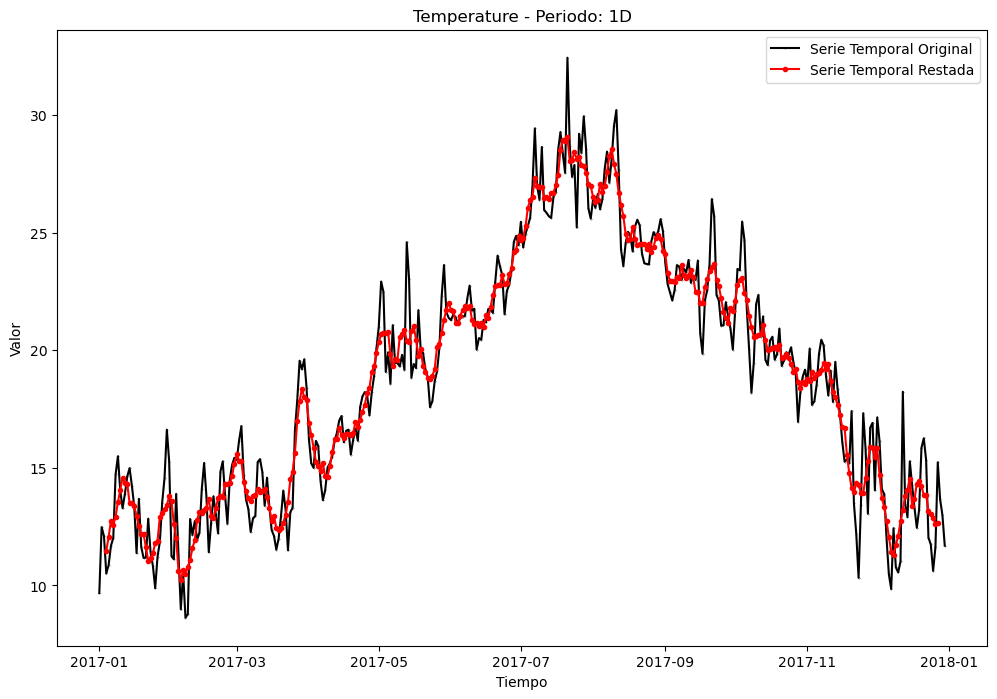

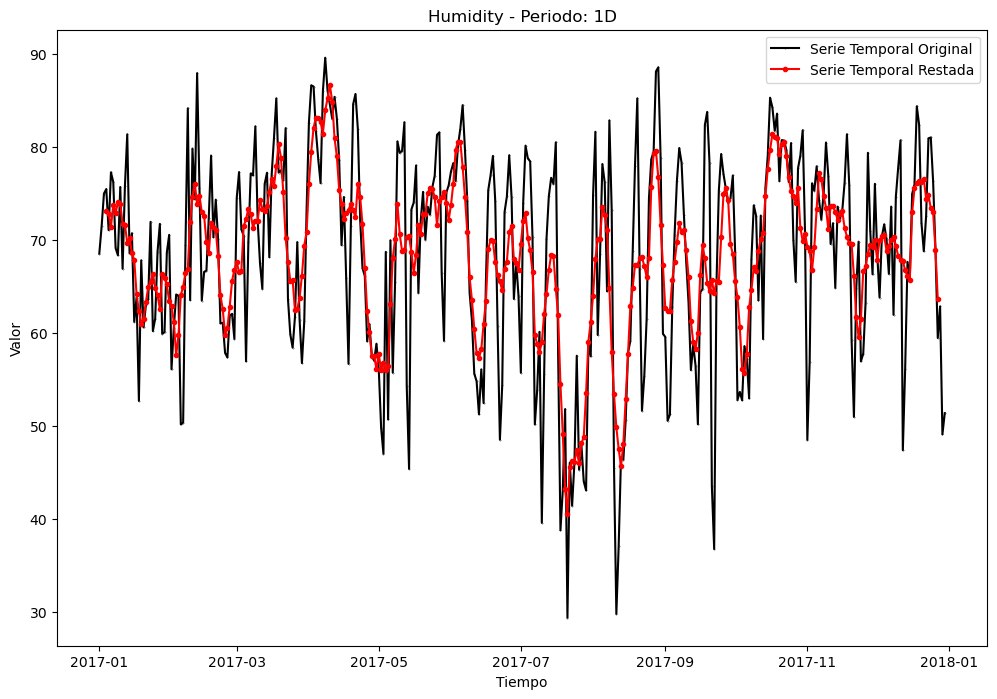

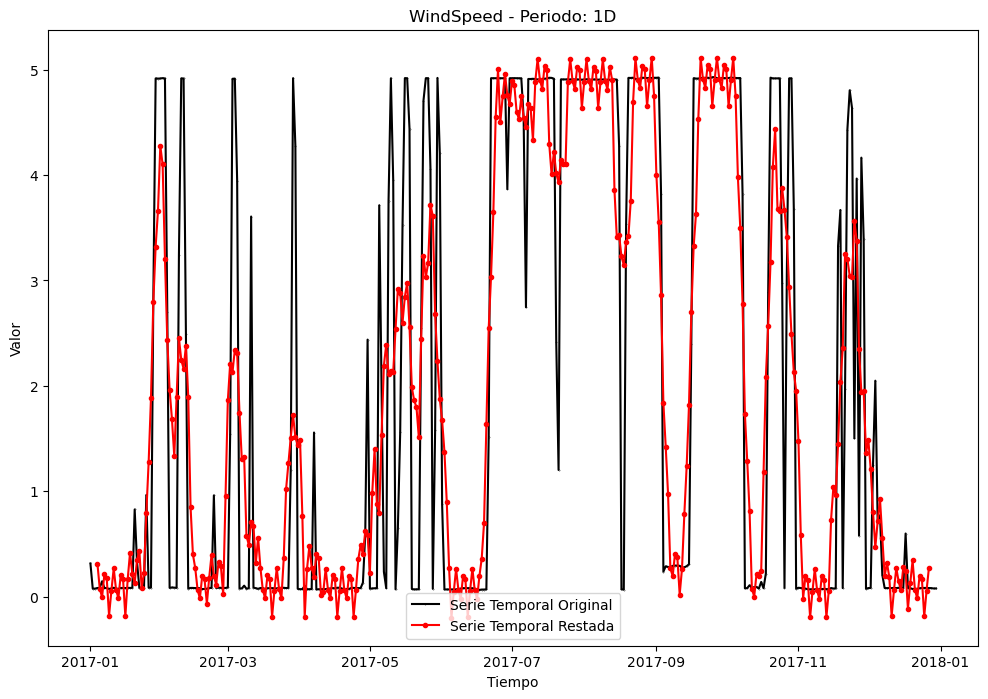

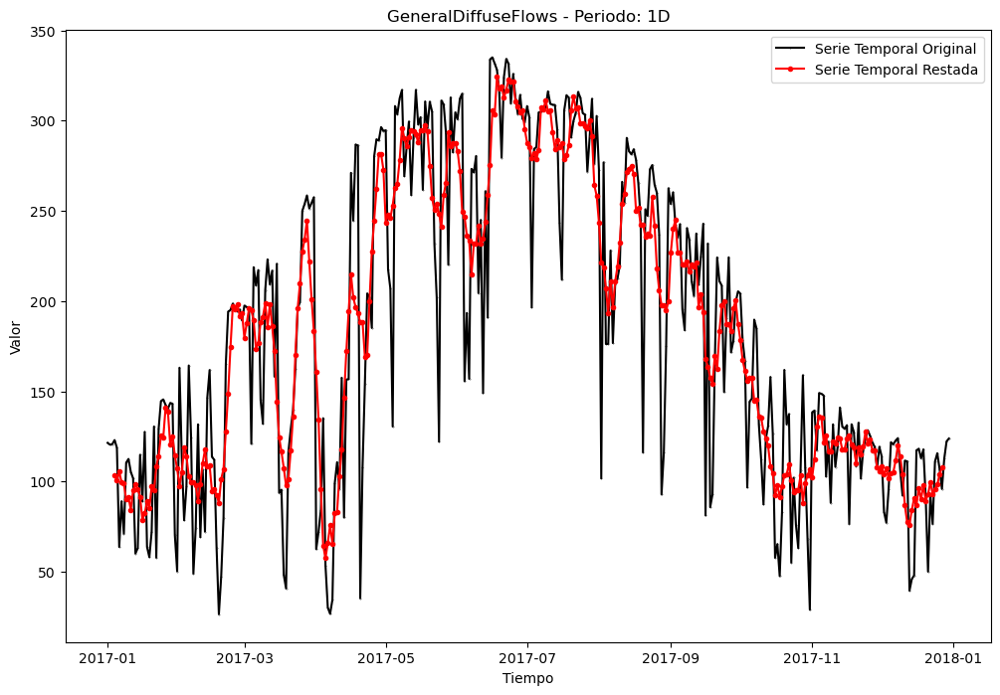

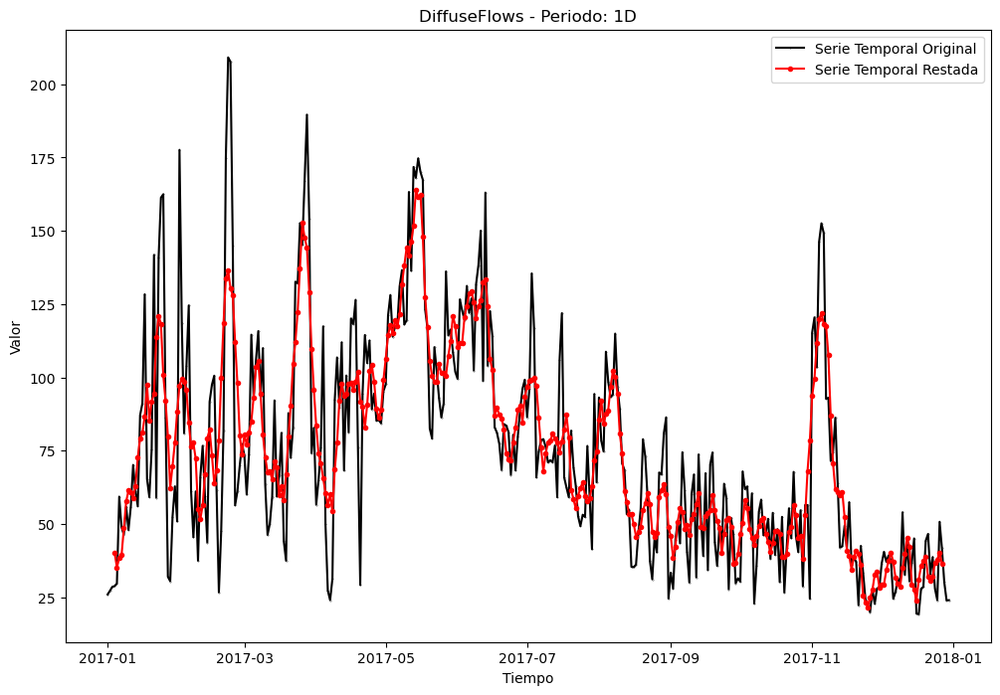

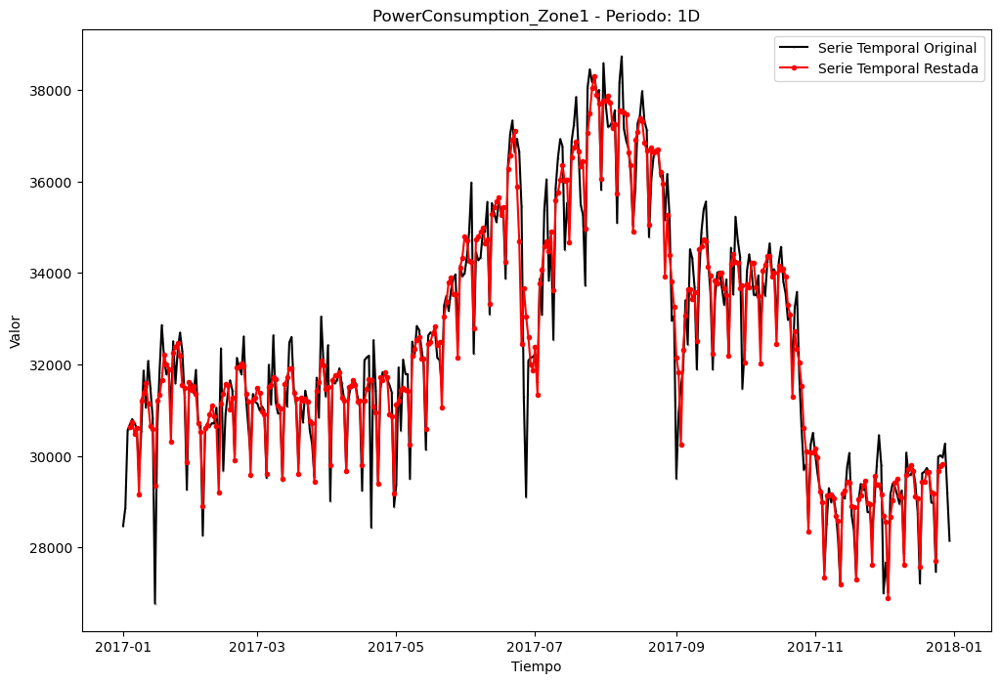

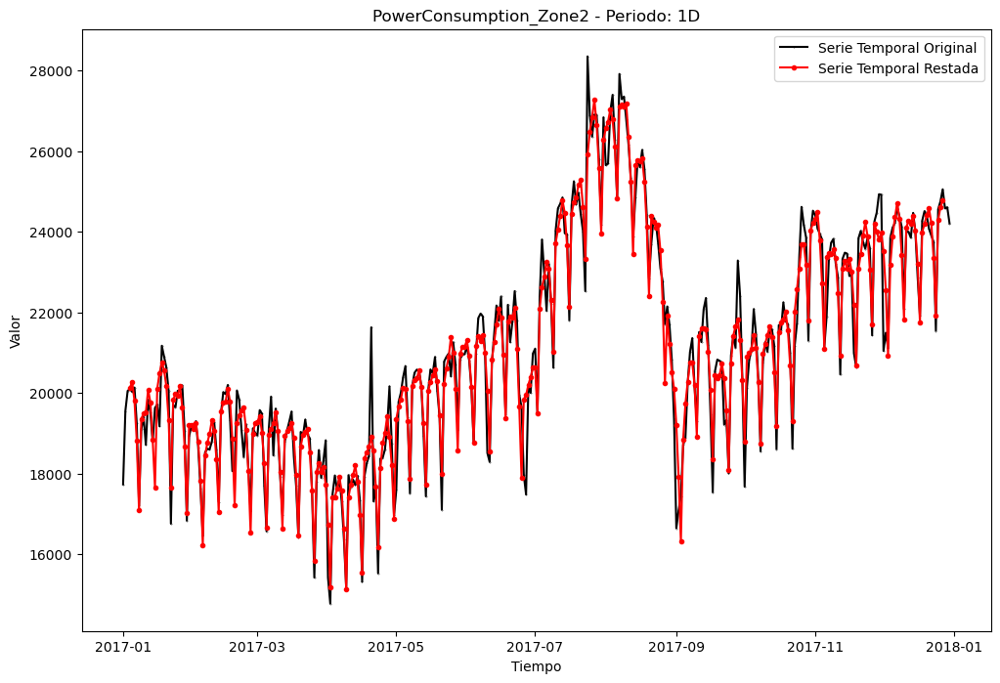

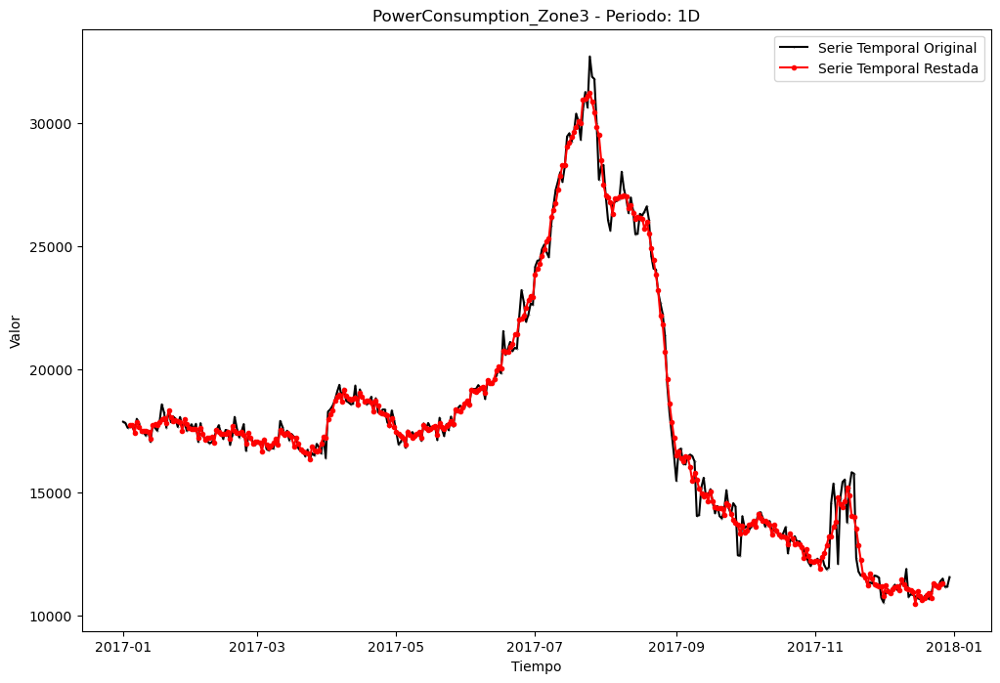

In [492]:
period = '1D'

resampled_df = datos.resample(period).mean()  # Agrega los datos según el período de tiempo
result = {}
for column, label in zip(resampled_df.columns, labels):
    result[label] = seasonal_decompose(resampled_df[column], model='additive')

# Restar el ruido de la serie temporal original
for label, decomposition in result.items():
    original_series = decomposition.observed
    noise_component = decomposition.resid

    subtracted_series = original_series - noise_component

    # Graficar la serie temporal original y la serie resultante después de la resta
    plt.figure(figsize=(12, 8))
    plt.plot(original_series, color='black', label='Serie Temporal Original', marker='o', markersize=0.2)
    plt.plot(subtracted_series, color='red', label='Serie Temporal Restada',marker='o', markersize=3)
    plt.title(f'{label} - Periodo: {period}')
    plt.xlabel('Tiempo')
    plt.ylabel('Valor')
    plt.legend()

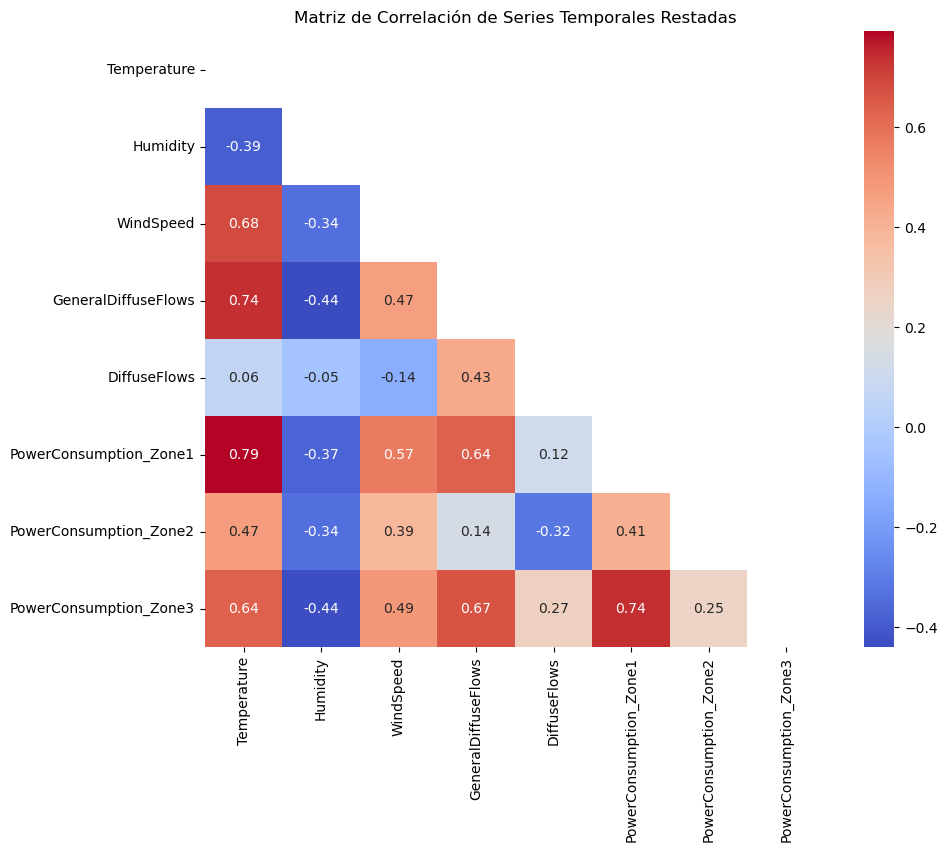

In [513]:
import numpy as np

# Calcula la matriz de correlación
correlation_matrix = subtracted_df.corr()

# Crea una máscara para ocultar la mitad superior triangular
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Grafica el mapa de calor de la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", mask=mask)
plt.title('Matriz de Correlación de Series Temporales Restadas')
plt.show()


In [495]:
period = '1D'

resampled_df = datos.resample(period).mean()  # Agrega los datos según el período de tiempo
result = {}
residuals_df = pd.DataFrame()  # DataFrame para almacenar los ruidos de todas las series

for column, label in zip(resampled_df.columns, labels):
    result[label] = seasonal_decompose(resampled_df[column], model='additive')

    # Obtener el componente de ruido y agregarlo al DataFrame
    residuals_df[label] = result[label].resid



            Temperature  Humidity  WindSpeed  GeneralDiffuseFlows  \
Datetime                                                            
2017-01-01          NaN       NaN        NaN                  NaN   
2017-01-02          NaN       NaN        NaN                  NaN   
2017-01-03          NaN       NaN        NaN                  NaN   
2017-01-04    -0.969438  2.399249  -0.232217            19.618211   
2017-01-05    -1.187496 -1.771278   0.006120            18.138733   

            DiffuseFlows  PowerConsumption_Zone1  PowerConsumption_Zone2  \
Datetime                                                                   
2017-01-01           NaN                     NaN                     NaN   
2017-01-02           NaN                     NaN                     NaN   
2017-01-03           NaN                     NaN                     NaN   
2017-01-04    -11.399652               63.062391              -36.623488   
2017-01-05     -5.492771               55.581448            

       Temperature    Humidity   WindSpeed  GeneralDiffuseFlows  DiffuseFlows  \
count   358.000000  358.000000  358.000000           358.000000    358.000000   
mean     -0.002433    0.026969   -0.000582            -0.043809      0.037574   
std       1.189142    7.541659    1.050001            37.275811     19.556505   
min      -3.957844  -27.479264   -3.588131          -152.815153    -62.478294   
25%      -0.775840   -4.393651   -0.271509           -18.643724    -11.334166   
50%      -0.132322    0.173473    0.003270             6.489488     -0.452456   
75%       0.693240    5.512769    0.268461            21.225585     10.565052   
max       5.016474   18.380107    3.198841            93.077645     80.405557   

       PowerConsumption_Zone1  PowerConsumption_Zone2  PowerConsumption_Zone3  
count              358.000000              358.000000              358.000000  
mean                 2.141381                0.582149                0.164152  
std                673.913528 

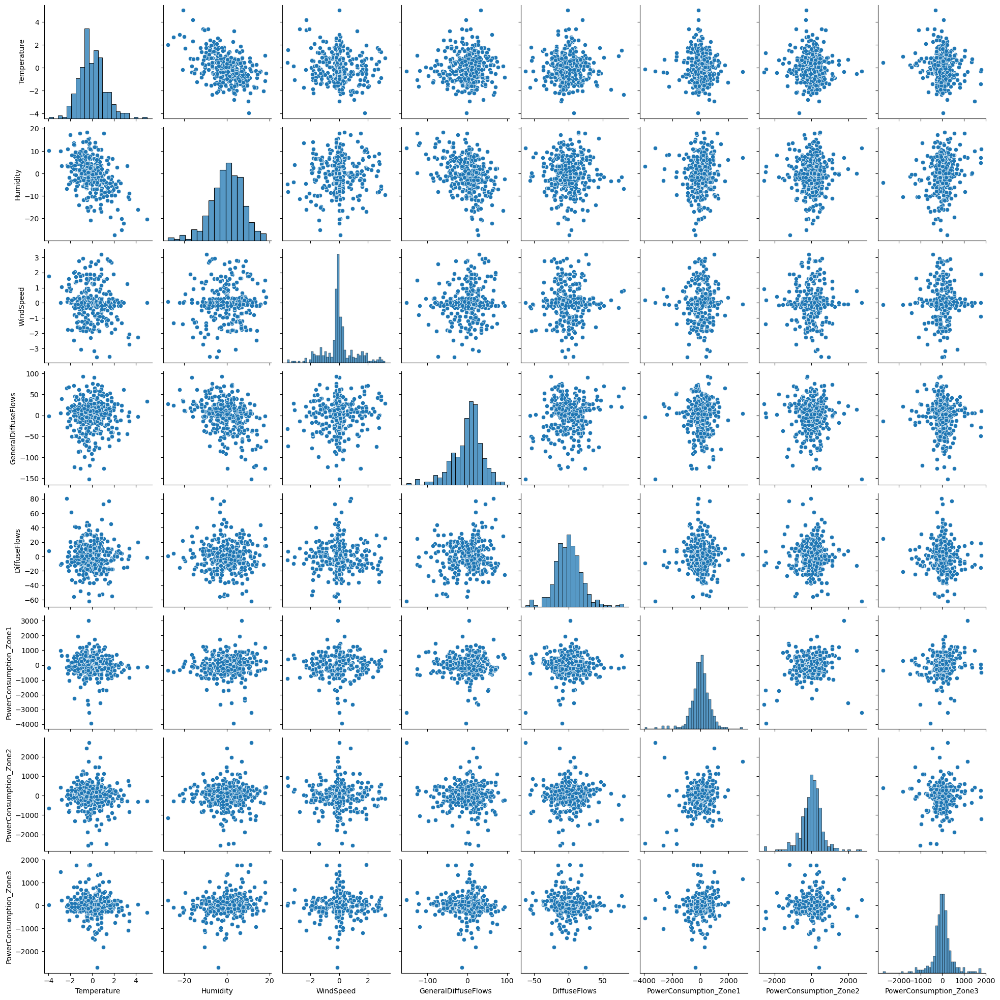

In [502]:
from scipy import stats
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Supongamos que tienes un DataFrame llamado residuals_df con los ruidos de todas las series temporales

# 1. Estadísticas descriptivas básicas
descriptive_stats = residuals_df.describe()
print(descriptive_stats)

sns.pairplot(residuals_df)
plt.show()




/Users/maxiabdala/opt/anaconda3/envs/prueba/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/maxiabdala/opt/anaconda3/envs/prueba/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/maxiabdala/opt/anaconda3/envs/prueba/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/maxiabdala/opt/anaconda3/envs/prueba/lib/python3.11/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Users/maxiabdala/opt/anacon

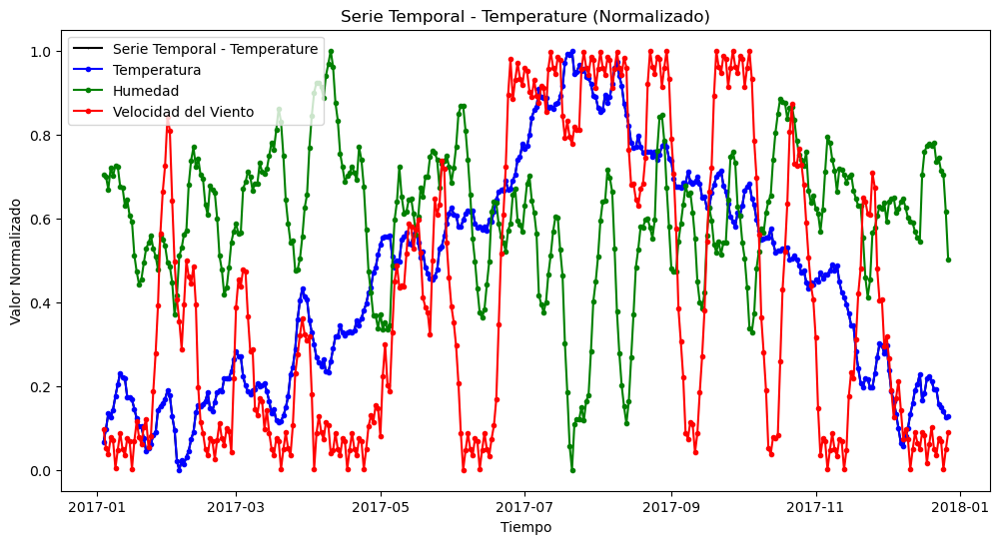

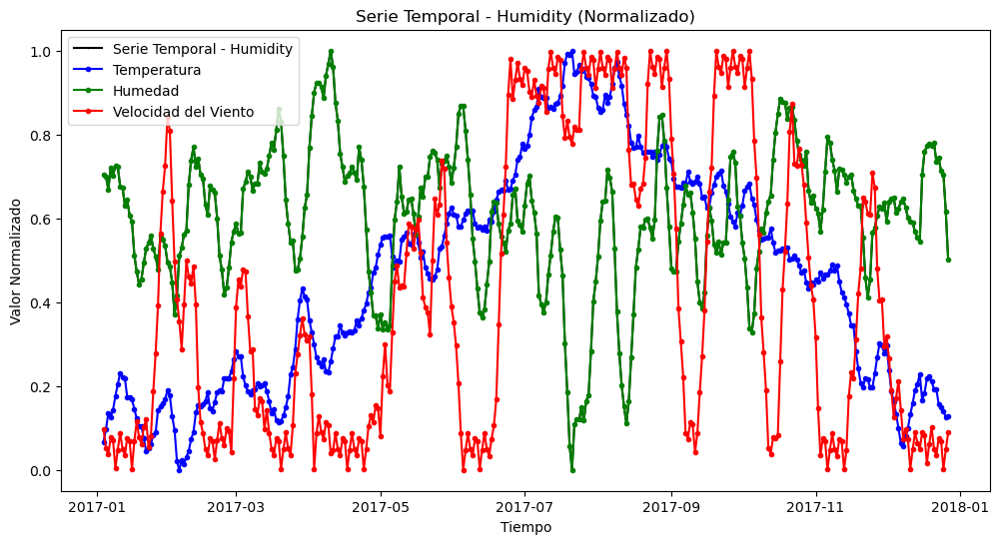

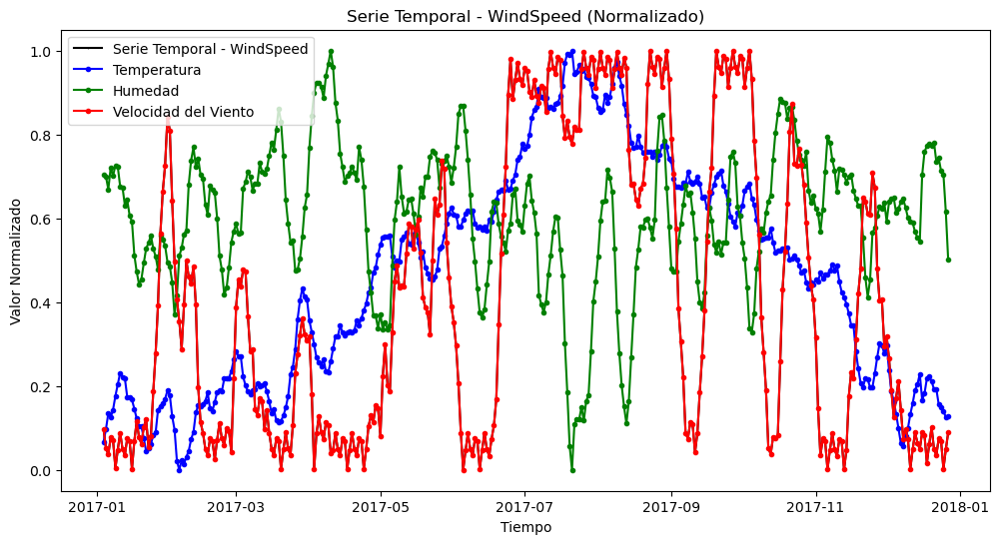

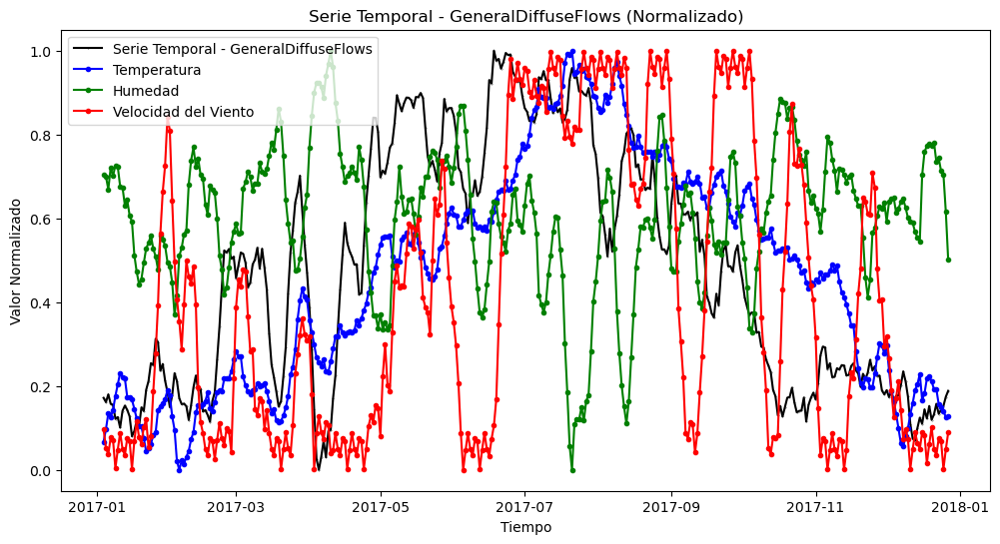

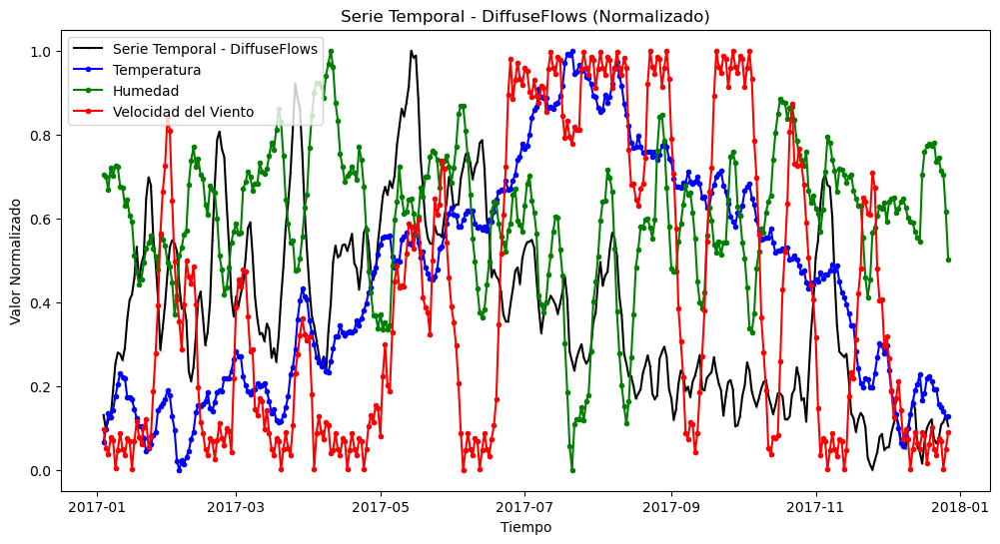

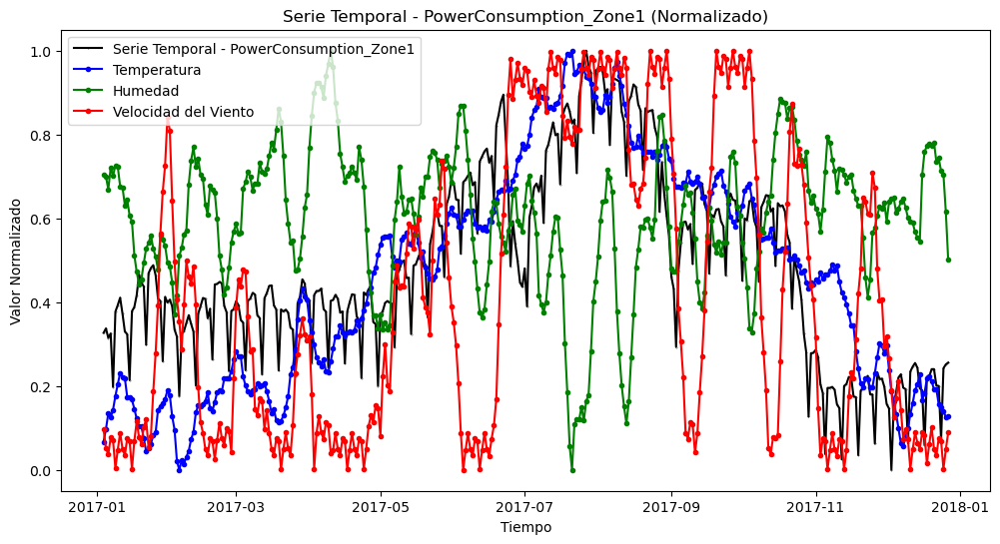

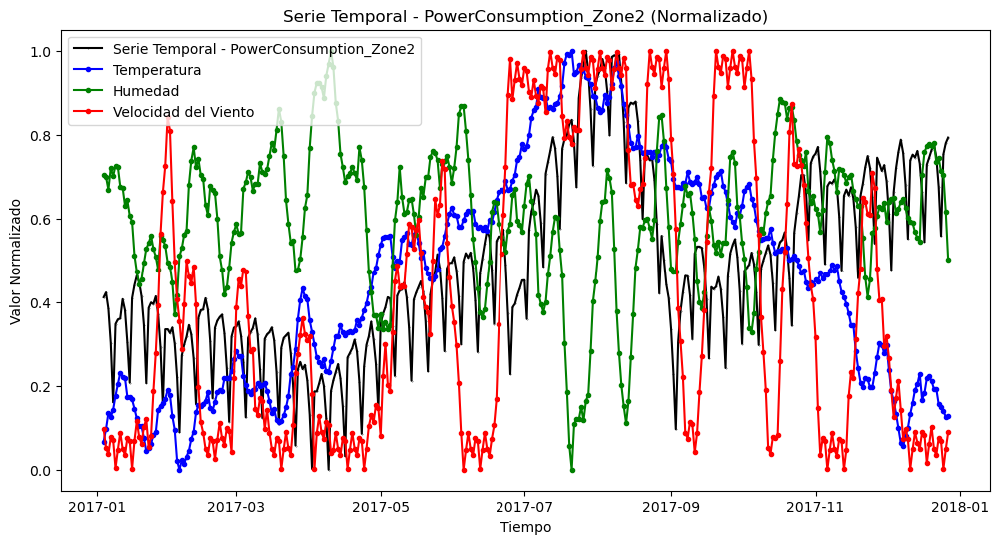

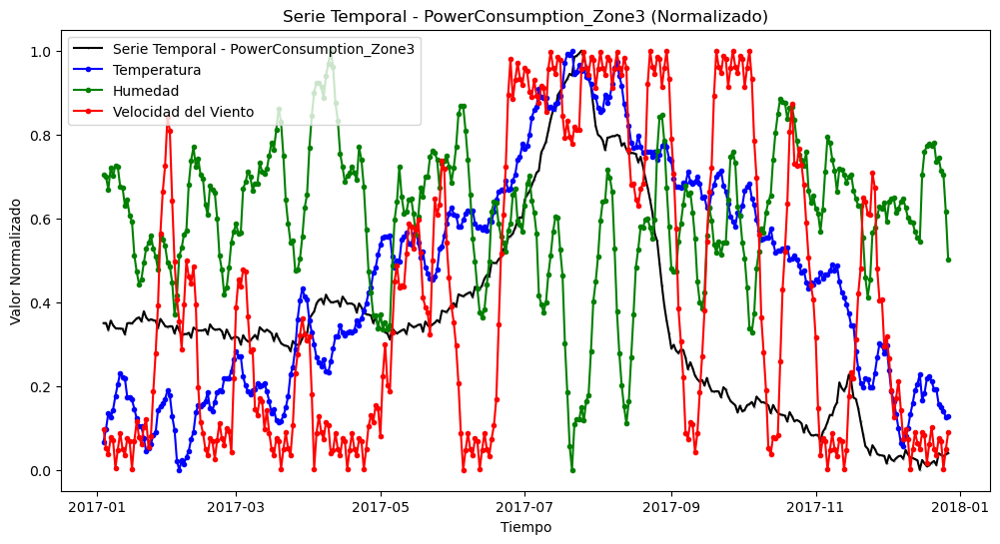

In [512]:
from sklearn.preprocessing import MinMaxScaler

# Normalizar las series
scaler = MinMaxScaler()
normalized_subtracted_df = subtracted_df.copy()  # Copia el DataFrame para no modificar el original
normalized_subtracted_df = scaler.fit_transform(normalized_subtracted_df)

# Convertir el DataFrame normalizado de nuevo en un DataFrame de pandas
normalized_subtracted_df = pd.DataFrame(normalized_subtracted_df, columns=subtracted_df.columns, index=subtracted_df.index)

# Crear las gráficas con las series normalizadas
for zone in normalized_subtracted_df.columns:
    plt.figure(figsize=(12, 6))
    plt.plot(normalized_subtracted_df[zone], color='black', label=f'Serie Temporal - {zone}', marker='o', markersize=0.2)

    # Graficar las series de temperatura, humedad y velocidad del viento normalizadas
    plt.plot(normalized_subtracted_df['Temperature'], color='blue', label='Temperatura', marker='o', markersize=3)
    plt.plot(normalized_subtracted_df['Humidity'], color='green', label='Humedad', marker='o', markersize=3)
    plt.plot(normalized_subtracted_df['WindSpeed'], color='red', label='Velocidad del Viento', marker='o', markersize=3)

    plt.title(f'Serie Temporal - {zone} (Normalizado)')
    plt.xlabel('Tiempo')
    plt.ylabel('Valor Normalizado')
    plt.legend()
    plt.show()

RangeIndex(start=0, stop=1, step=1)
